# Aggregated Evaluation

In [15]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0
#imports
import os , sys
sys.path.append('/home/ubuntu/')
os.chdir('/home/ubuntu/')
import numpy as np

import importlib
import src.model
importlib.reload(src.model)
import src.model as mdl

import sklearn.metrics as metrics
import pylab as pl
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.metrics import average_precision_score, precision_recall_curve
import seaborn as sns

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [16]:
#all paths
datapath = '/mnt/data/'
resultspath = '/mnt/data/results/'
predictionspath = '/mnt/data/results/all_predictions/'
plotspath = '/mnt/data/results/plots/'


# Baseline model _standard_original

data_auroc_A_new = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])

#auroc and auprc plots of all models separately and then boxplot of all roc_values
from matplotlib import pyplot as pt
from sklearn.metrics import average_precision_score, precision_recall_curve

#path = f'{resultspath}predictions/'
path = f'{resultspath}all_predictions/_standard_original/'
directory1 = os.listdir(path)



#tic()

for file in directory1:
    
    if 'csv' in file: 
        #print(file)
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        
        
        folder = rbp
        path_figure = f'{plotspath}/summary_metrics/{folder}/'
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        
        average_precision = average_precision_score(df['True'], df['Predictions'])
        
        #roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)

        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        


        '''
        # Generate figure
        fig = pl.figure(figsize=(14,7))
        ax = fig.add_subplot(121)

        pl.plot(fpr, tpr, label=" (AUC=%.2f)" % roc_auc)
        ax.plot([0,1], [0,1], color="grey",label="Random Classifier",linestyle="--")
        ax.set_xlabel("False Positive Rate")
        ax.set_ylabel("True Positive Rate")
        ax.set_ylim(0,1)
        ax.set_xlim(0,1)
        ax.grid(color="#CCCCCC")
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        rbp = str(file).split('.')[0]
        pt.title('AUROC %s' % rbp)
        pl.legend()
        pl.tight_layout()

    
    # pr_auc
    from sklearn.metrics import average_precision_score, precision_recall_curve
    from sklearn.metrics import PrecisionRecallDisplay
    average_precision = average_precision_score(df['True'], df['Predictions'])
    
    display = PrecisionRecallDisplay.from_predictions(df['True'], df['Predictions'])
    _ = display.ax_.set_title("Precision-Recall %s" % rbp)'''
    
    datafile_A_new= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
   
    
    data_auroc_A_new = pd.concat([data_auroc_A_new,datafile_A_new])

mdl.create_table_latex(data_auroc_A_new)

data_auroc_A_new

import seaborn as sns
sns.boxplot(x=data_auroc_A_new["roc_auc_score"]).set(title='Receiver Operating Characteristic scores for the model setting A - new')

sns.boxplot(x=data_auroc_A_new["pr_auc_score"]).set(title='Precision Recall scores for the model setting A -new')

In [17]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_standard_original'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)


for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
#mdl.create_table_latex(data_auc)
data_auc['pr_auc_score'].mean()
data_auc_og = data_auc
data_auc_og['model'] = 'Untuned'

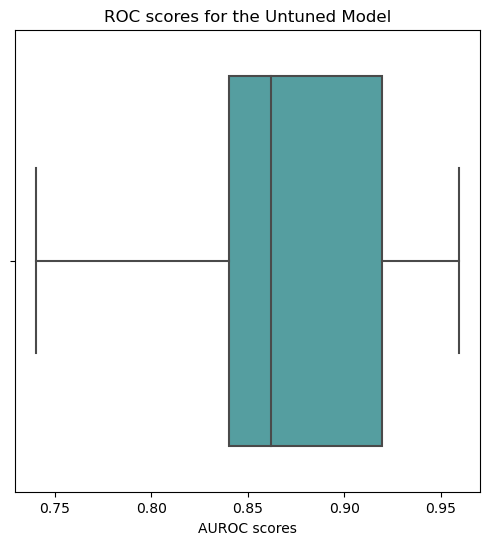

In [108]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Untuned Model')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

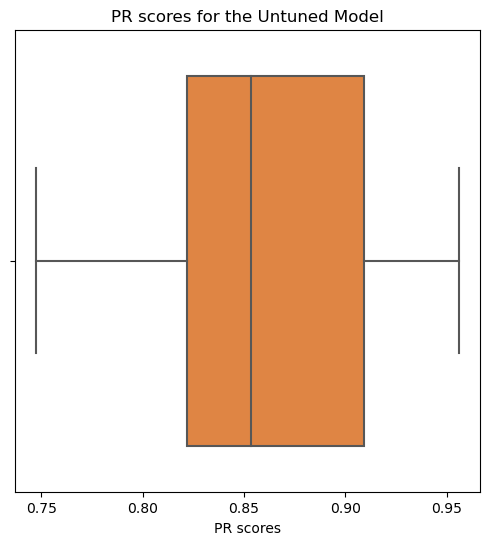

In [109]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Untuned Model')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# _tuned_original

In [18]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_tuned_original'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
#print(data_auc)    
#mdl.create_table_latex(data_auc)
data_auc['roc_auc_score'].mean()
data_auc_tun = data_auc
data_auc_tun['model'] = 'Tuned'

<AxesSubplot: xlabel='model', ylabel='roc_auc_score'>

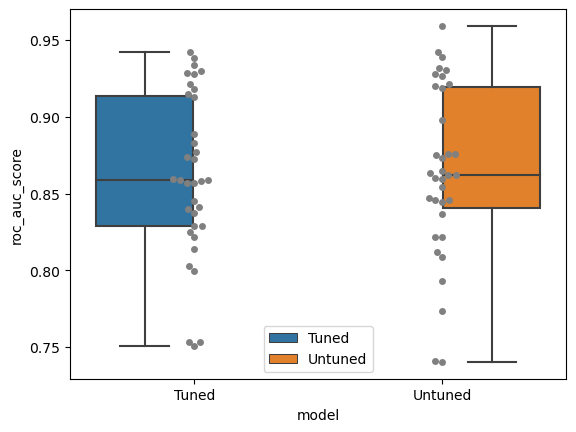

In [187]:
data_auc = pd.concat([data_auc_tun, data_auc_og])
sns.boxplot(x=data_auc["roc_auc_score"], y = data_auc['model'], hue = data_auc['model'])


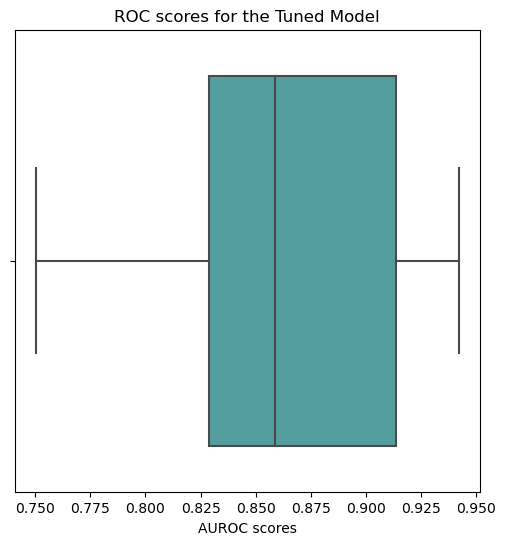

In [173]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Tuned Model')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

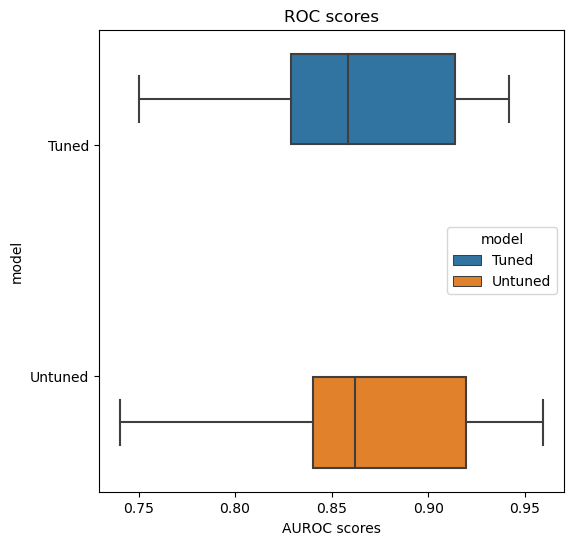

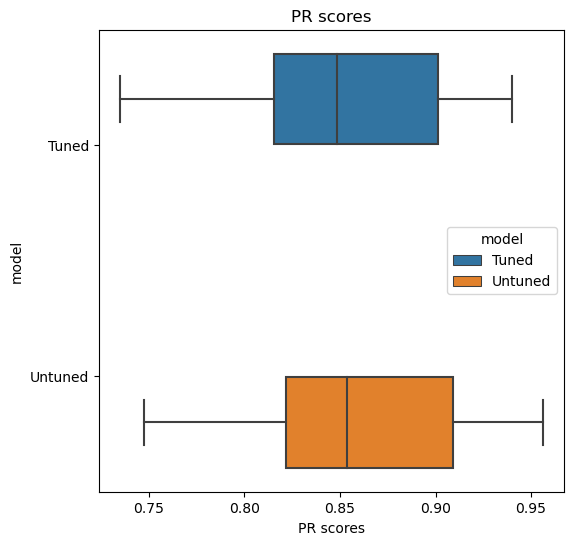

In [21]:
(mdl.boxplot_double_roc(data_auc_tun, data_auc_og, 'ROC scores')).savefig(
    f'{plotspath}ROC_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

(mdl.boxplot_double_pr(data_auc_tun, data_auc_og, 'PR scores')).savefig(
    f'{plotspath}PR_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

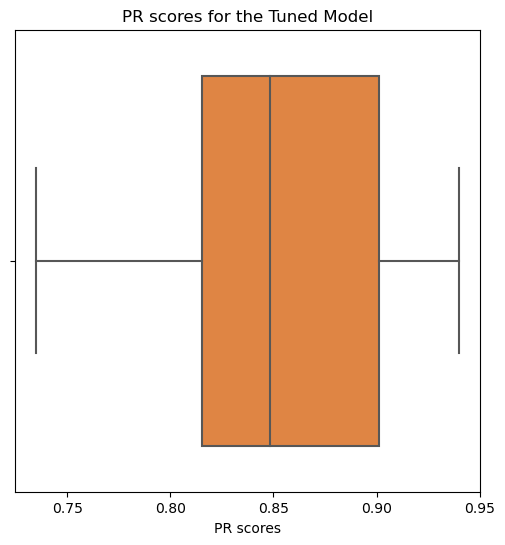

In [112]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Tuned Model')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# _suggested_tuned_original

In [113]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_suggested_tuned_original'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
#print(data_auc)    
mdl.create_table_latex(data_auc)

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & AKAP1 & 0.8407 & 0.8301 \\
HepG2 & DDX55 & 0.8538 & 0.8345 \\
HepG2 & DDX6 & 0.8498 & 0.8248 \\
HepG2 & IGF2BP3 & 0.8718 & 0.8604 \\
HepG2 & LARP4 & 0.8472 & 0.8085 \\
HepG2 & PCBP1 & 0.9231 & 0.8936 \\
HepG2 & RBM15 & 0.9157 & 0.9026 \\
HepG2 & SUB1 & 0.8622 & 0.8392 \\
HepG2 & UPF1 & 0.8587 & 0.8409 \\
K562 & AKAP1 & 0.8172 & 0.7947 \\
K562 & APOBEC3C & 0.8409 & 0.8273 \\
K562 & CPEB4 & 0.7773 & 0.7709 \\
K562 & DDX55 & 0.8569 & 0.8392 \\
K562 & DDX6 & 0.8717 & 0.8582 \\
K562 & IGF2BP1 & 0.8431 & 0.8122 \\
K562 & IGF2BP2 & 0.9089 & 0.8898 \\
K562 & LARP4 & 0.8391 & 0.8262 \\
K562 & METAP2 & 0.9117 & 0.8957 \\
K562 & NOLC1 & 0.8205 & 0.7959 \\
K562 & NPM1 & 0.7737 & 0.7858 \\
K562 & PABPC4 & 0.8324 & 0.8188 \\
K562 & PCBP1 & 0.9416 & 0.9336 \\
K562 & PUM1 & 0.9468 & 0.9432 \\
K562 & PUM2 & 0.8927 & 0.8939 \\
K562 & RBM15 & 0.9484 & 0.9432 \\
K562 & RPS3 & 0.9384 & 0.9194 \\
K562 & SDAD1 &

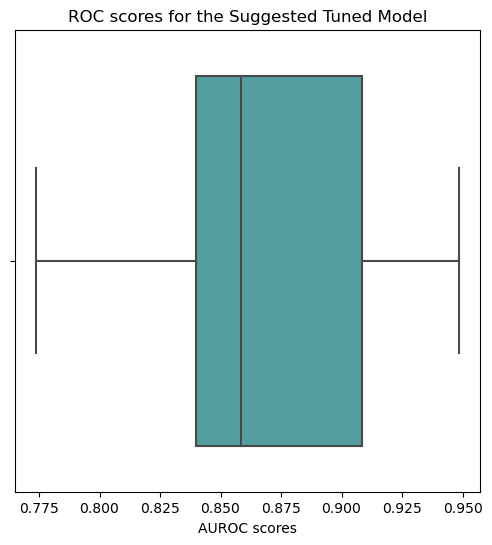

In [114]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Suggested Tuned Model')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

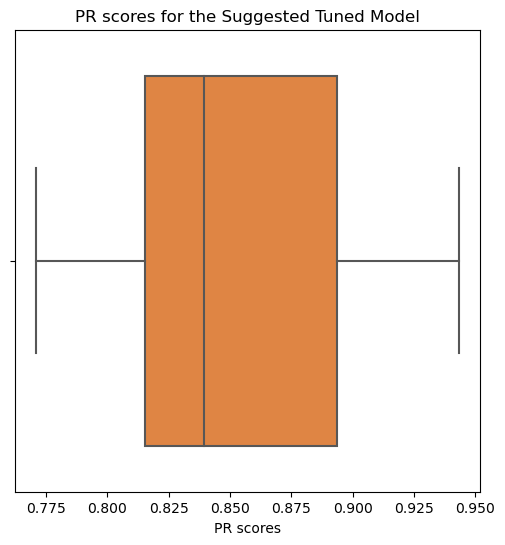

In [115]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Suggested Tuned Model')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Negative1

# Baseline Model (setting A) _baseline_A

In [118]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_baseline_A'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)


for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)

(mdl.boxplot_roc(data_auc, 'Receiver Operating Characteristic scores for the baseline model setting A - Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

(mdl.boxplot_pr(data_auc, 'Precision Recall scores for the baseline model setting A - Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Model Setting A 

In [119]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_setting_A'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
#print(np.shape(data_auc))    
mdl.create_table_latex(data_auc)

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & LARP4 & 0.5507 & 0.9713 \\
HepG2 & PCBP1 & 0.7685 & 0.9859 \\
HepG2 & RBM15 & 0.5000 & 0.5000 \\
HepG2 & SUB1 & 0.6472 & 0.9765 \\
K562 & AKAP1 & 0.5537 & 0.9544 \\
K562 & PCBP1 & 0.6477 & 0.9668 \\
K562 & SDAD1 & 0.4314 & 0.8983 \\
K562 & UPF1 & 0.5726 & 0.9676 \\
\bottomrule
\end{tabular}



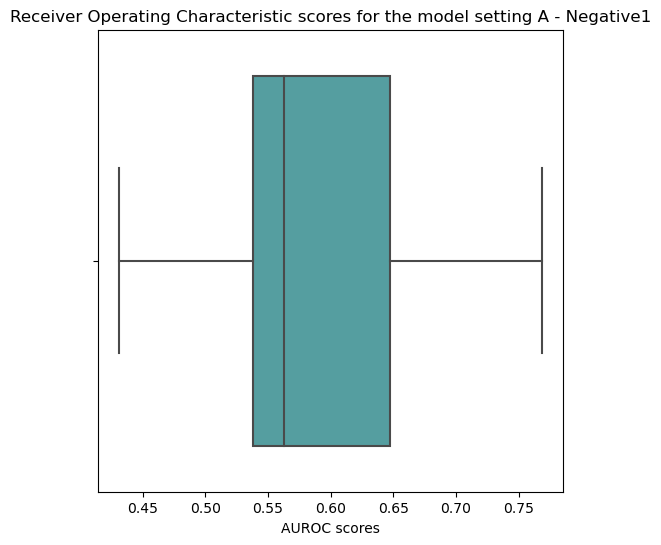

In [120]:
(mdl.boxplot_roc(data_auc, 'Receiver Operating Characteristic scores for the model setting A - Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

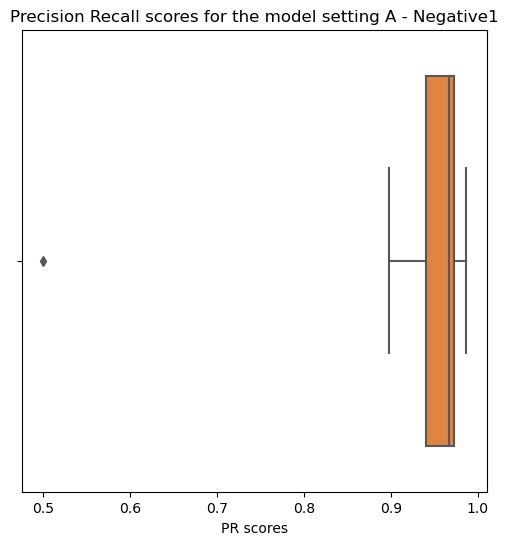

In [121]:
(mdl.boxplot_pr(data_auc, 'Precision Recall scores for the model setting A - Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Baseline Setting B

In [122]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_baseline_B'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & RBM15 & 0.7274 & 0.9814 \\
\bottomrule
\end{tabular}



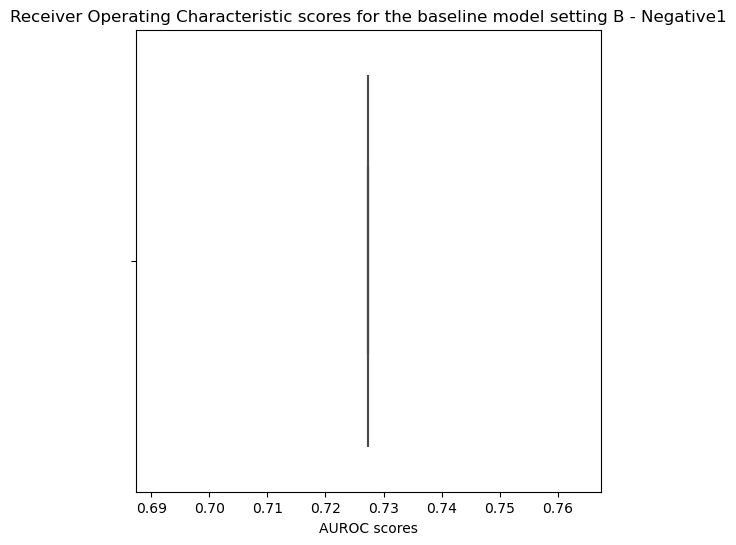

In [123]:
(mdl.boxplot_roc(data_auc, 'Receiver Operating Characteristic scores for the baseline model setting B - Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

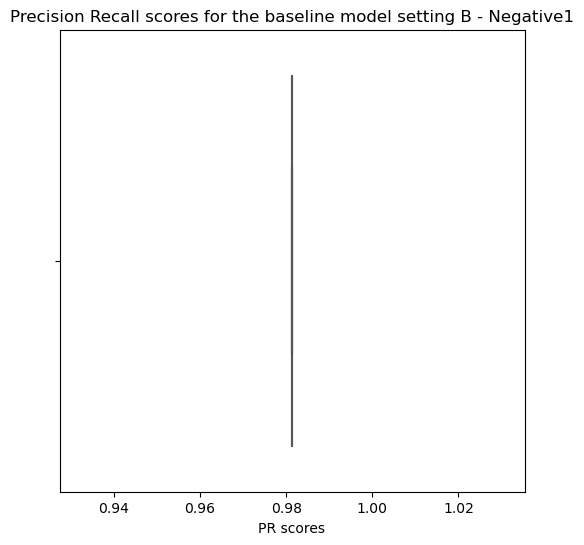

In [124]:
(mdl.boxplot_pr(data_auc, 'Precision Recall scores for the baseline model setting B - Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Model Setting B 

In [125]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_setting_B'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & RBM15 & 0.5000 & 0.9667 \\
\bottomrule
\end{tabular}



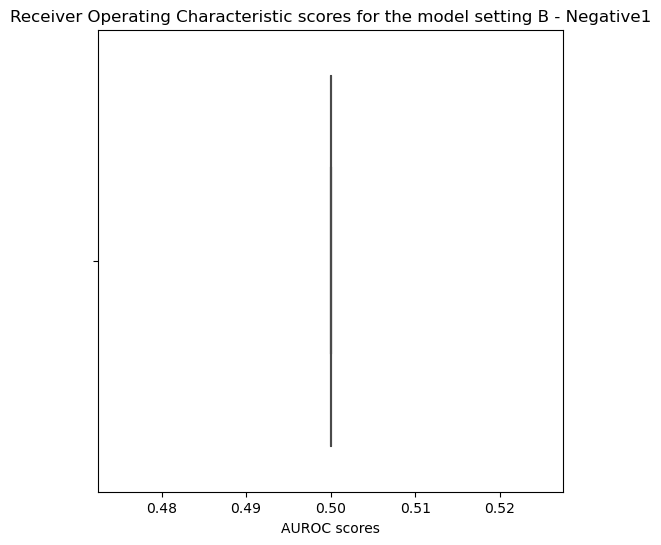

In [126]:
(mdl.boxplot_roc(data_auc, 'Receiver Operating Characteristic scores for the model setting B - Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

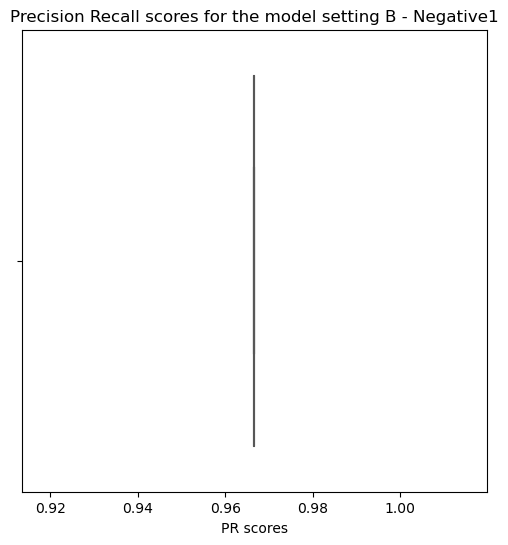

In [127]:
(mdl.boxplot_pr(data_auc, 'Precision Recall scores for the model setting B - Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Baseline Setting A augmented

In [22]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_baseline_A_aug'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        try:
            folder = rbp
            path_figure = f'{plotspath}summary_metrics/{folder}/'
            #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
            #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        except:
            continue
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
data_auc['rbp']= data_auc['rbp'].str[:-1]    
mdl.create_table_latex(data_auc)
data_auc['pr_auc_score'].mean()
data_auc_tun = data_auc
data_auc_tun['model'] = 'Baseline'

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG & AKAP1 & 0.5602 & 0.9249 \\
HepG & DDX6 & 0.6533 & 0.9140 \\
HepG & IGF2BP3 & 0.5000 & 0.8489 \\
HepG & LARP4 & 0.5000 & 0.9176 \\
HepG & PCBP1 & 0.5000 & 0.8939 \\
HepG & RBM15 & 0.5000 & 0.4928 \\
HepG & SUB1 & 0.4238 & 0.8989 \\
HepG2 & AKAP1 & 0.5813 & 0.6422 \\
HepG2 & DDX55 & 0.5000 & 0.4735 \\
HepG2 & DDX6 & 0.5463 & 0.4094 \\
HepG2 & IGF2BP3 & 0.5513 & 0.6123 \\
HepG2 & LARP4 & 0.5263 & 0.5312 \\
HepG2 & PCBP1 & 0.6083 & 0.6584 \\
HepG2 & RBM15 & 0.6162 & 0.5528 \\
HepG2 & SUB1 & 0.4088 & 0.4048 \\
HepG2 & UPF1 & 0.6601 & 0.7467 \\
K56 & AKAP1 & 0.4685 & 0.8733 \\
K56 & APOBEC3C & 0.5000 & 0.9146 \\
K56 & CPEB4 & 0.0959 & 0.9246 \\
K56 & DDX55 & 0.5000 & 0.8626 \\
K56 & DDX6 & 0.5000 & 0.9031 \\
K56 & IGF2BP1 & 0.5557 & 0.9614 \\
K56 & METAP2 & 0.4995 & 0.9061 \\
K56 & NOLC1 & 0.6462 & 0.9558 \\
K56 & PCBP1 & 0.6435 & 0.9103 \\
K56 & PUM2 & 0.6536 & 0.9378 \\
K56 & SDAD1 & 0.5566 & 0

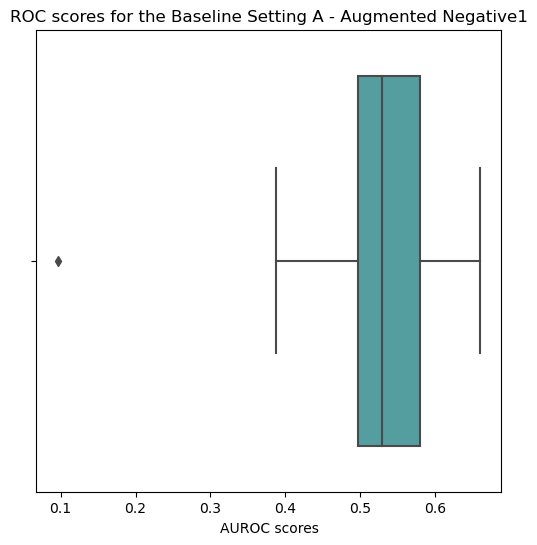

In [129]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Baseline Setting A - Augmented Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

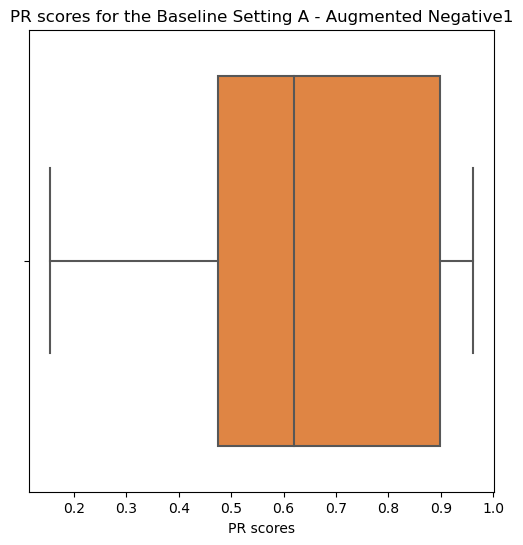

In [130]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Baseline Setting A - Augmented Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Model Setting A augmented

In [24]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_setting_A_aug'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        '''
        try:
            folder = rbp.str[:-1]
            path_figure = f'{plotspath}summary_metrics/{folder}/'
            #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
            #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        except:
            continue
        '''
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])

data_auc['rbp']= data_auc['rbp'].str[:-1]
mdl.create_table_latex(data_auc)
data_auc['roc_auc_score'].mean()
data_auc_og = data_auc
data_auc_og['model'] = 'Integrated'

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG & RBM15 & 0.5000 & 0.4928 \\
HepG2 & AKAP1 & 0.6325 & 0.7010 \\
HepG2 & DDX55 & 0.4425 & 0.4407 \\
HepG2 & DDX6 & 0.4843 & 0.3634 \\
HepG2 & IGF2BP3 & 0.4458 & 0.5244 \\
HepG2 & LARP4 & 0.5498 & 0.5151 \\
HepG2 & PCBP1 & 0.6505 & 0.6379 \\
HepG2 & SUB1 & 0.5047 & 0.5059 \\
HepG2 & UPF1 & 0.5319 & 0.6185 \\
K562 & AKAP1 & 0.5974 & 0.5291 \\
K562 & APOBEC3C & 0.3838 & 0.4370 \\
K562 & CPEB4 & 0.6126 & 0.8440 \\
K562 & DDX55 & 0.5823 & 0.4841 \\
K562 & DDX6 & 0.4954 & 0.4912 \\
K562 & IGF2BP1 & 0.4999 & 0.6376 \\
K562 & IGF2BP2 & 0.4966 & 0.4064 \\
K562 & LARP4 & 0.5329 & 0.6019 \\
K562 & METAP2 & 0.6349 & 0.6110 \\
K562 & METAP2 & 0.6349 & 0.6110 \\
K562 & NOLC1 & 0.4899 & 0.6107 \\
K562 & NPM1 & 0.3160 & 0.2400 \\
K562 & PABPC4 & 0.5127 & 0.4678 \\
K562 & PCBP1 & 0.6493 & 0.5413 \\
K562 & PUM1 & 0.5980 & 0.4871 \\
K562 & PUM2 & 0.5348 & 0.5294 \\
K562 & RBM15 & 0.6583 & 0.6009 \\
K562 & RPS3 &

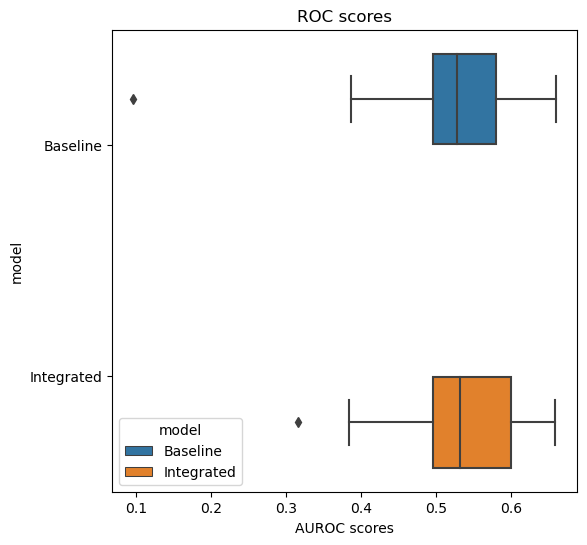

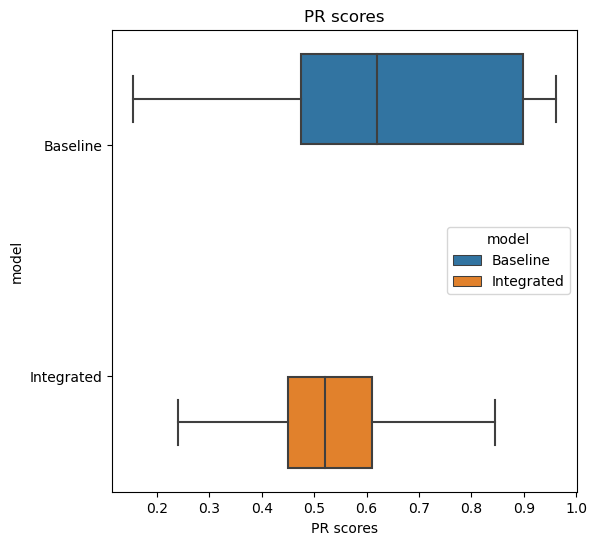

In [25]:
(mdl.boxplot_double_roc(data_auc_tun, data_auc_og, 'ROC scores')).savefig(
    f'{plotspath}ROC_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

(mdl.boxplot_double_pr(data_auc_tun, data_auc_og, 'PR scores')).savefig(
    f'{plotspath}PR_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

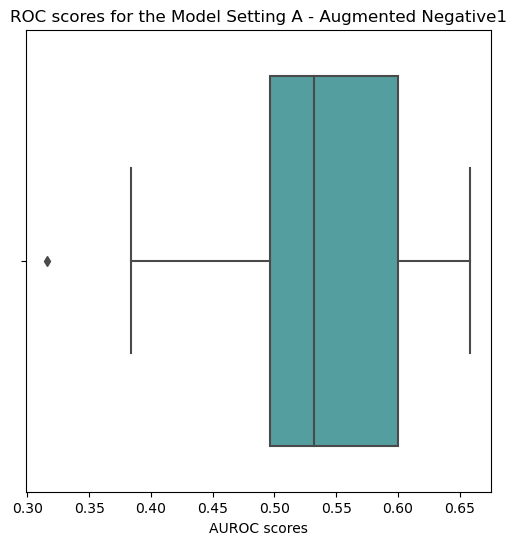

In [132]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Model Setting A - Augmented Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

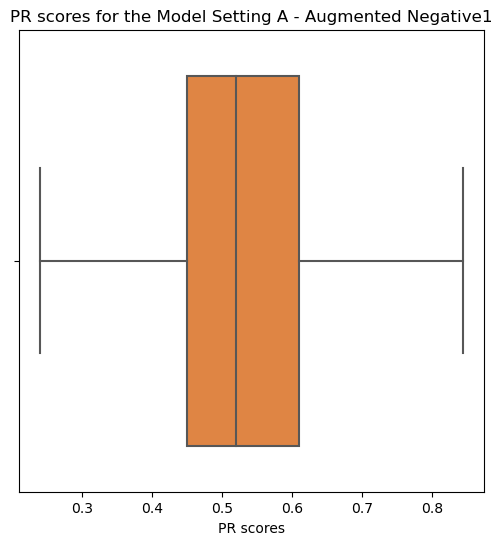

In [133]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Model Setting A - Augmented Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Baseline Setting B augmented

In [26]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_baseline_B_aug'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        '''
        try:
            folder = rbp.str[:-1]
            path_figure = f'{plotspath}summary_metrics/{folder}/'
            fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
            fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        except:
            continue
        '''    
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])

    #data_auc['rbp']= data_auc['rbp'].str[:-1]
#mdl.create_table_latex(data_auc)
data_auc
data_auc_og = data_auc
data_auc_og['model'] = 'Baseline'

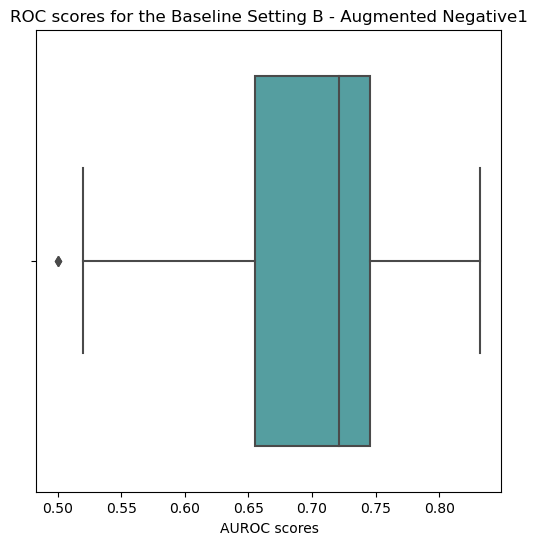

In [135]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Baseline Setting B - Augmented Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

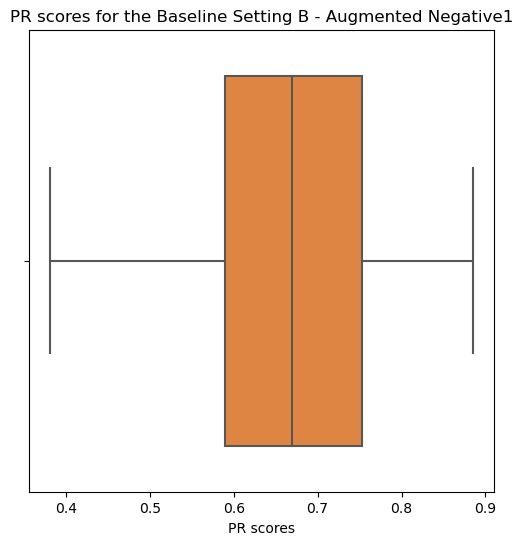

In [136]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Baseline Setting B - Augmented Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf')

# Model Setting B augmented

In [28]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_setting_B_aug'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)

for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        '''
        try: 
            folder = rbp.str[:-1]
            path_figure = f'{plotspath}summary_metrics/{folder}/'
            fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
            fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        except:
            continue
        '''
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
data_auc['rbp']= data_auc['rbp'].str[:-1]   
mdl.create_table_latex(data_auc)
data_auc_tun = data_auc
data_auc_tun['model'] = 'Integrated'

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & AKAP1 & 0.7315 & 0.7889 \\
HepG2 & DDX55 & 0.6364 & 0.6050 \\
HepG2 & DDX6 & 0.6624 & 0.5450 \\
HepG2 & IGF2BP3 & 0.6876 & 0.6955 \\
HepG2 & LARP4 & 0.6431 & 0.5836 \\
HepG2 & PCBP1 & 0.8469 & 0.8262 \\
HepG2 & RBM15 & 0.7221 & 0.6582 \\
HepG2 & SUB1 & 0.5961 & 0.5063 \\
HepG2 & UPF1 & 0.7635 & 0.7721 \\
K562 & AKAP1 & 0.7792 & 0.7465 \\
K562 & APOBEC3C & 0.6514 & 0.6807 \\
K562 & CPEB4 & 0.7822 & 0.9017 \\
K562 & DDX55 & 0.6598 & 0.5309 \\
K562 & DDX6 & 0.7180 & 0.6766 \\
K562 & IGF2BP1 & 0.5827 & 0.6916 \\
K562 & IGF2BP2 & 0.7128 & 0.5464 \\
K562 & LARP4 & 0.7411 & 0.7762 \\
K562 & METAP2 & 0.8149 & 0.7962 \\
K562 & NOLC1 & 0.6441 & 0.7162 \\
K562 & NPM1 & 0.4655 & 0.2106 \\
K562 & PABPC4 & 0.6566 & 0.5625 \\
K562 & PCBP1 & 0.8589 & 0.7905 \\
K562 & PUM1 & 0.7665 & 0.6531 \\
K562 & PUM2 & 0.7145 & 0.6037 \\
K562 & RBM15 & 0.7872 & 0.7762 \\
K562 & RPS3 & 0.7133 & 0.5470 \\
K562 & SDAD1 &

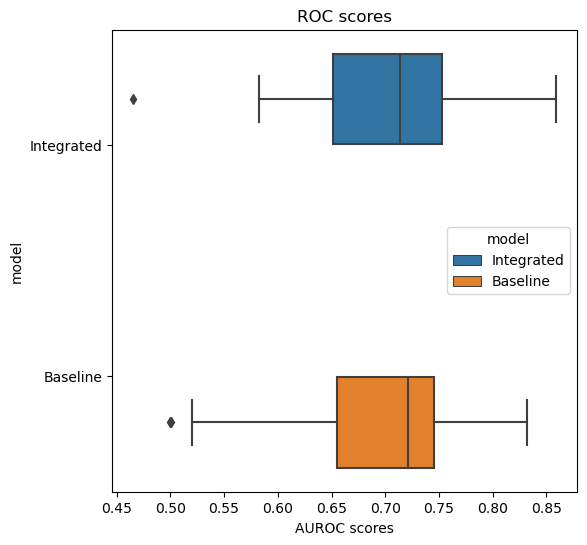

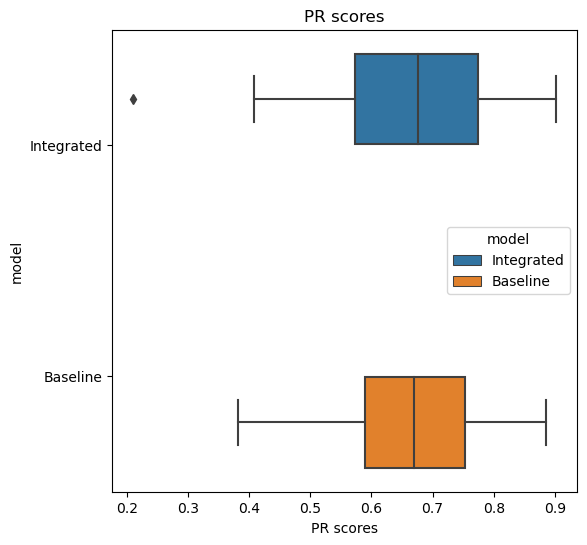

In [29]:
(mdl.boxplot_double_roc(data_auc_tun, data_auc_og, 'ROC scores')).savefig(
    f'{plotspath}ROC_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

(mdl.boxplot_double_pr(data_auc_tun, data_auc_og, 'PR scores')).savefig(
    f'{plotspath}PR_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

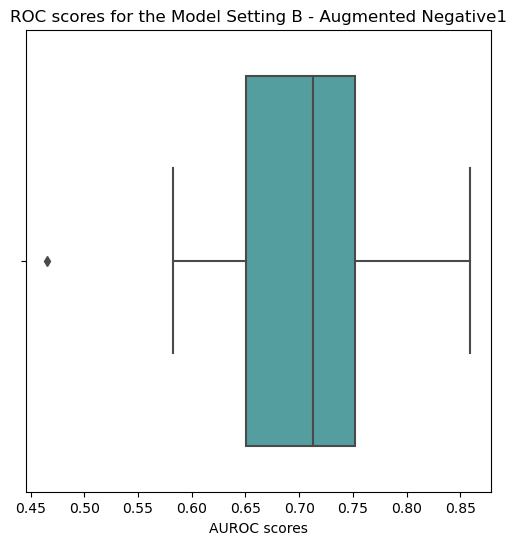

In [138]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Model Setting B - Augmented Negative1')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

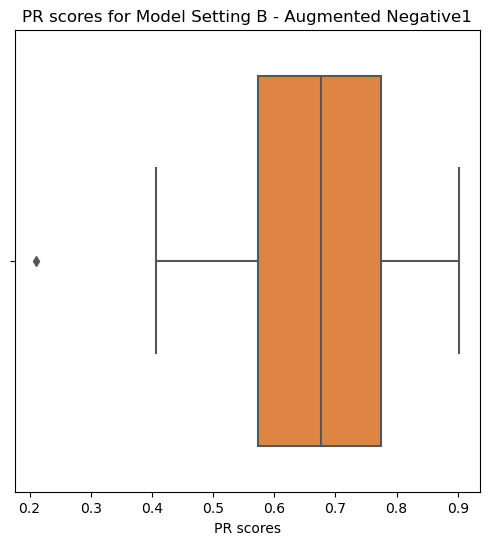

In [139]:
(mdl.boxplot_pr(data_auc, 'PR scores for Model Setting B - Augmented Negative1')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Negative 2 

# Baseline Model (setting A) _baseline_A

# Model Setting A 

# Baseline Setting B

# Model Setting B 

# Baseline Setting A augmented

/home/ubuntu/src/model.py:843: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 30))


\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & AKAP1 & 0.4864 & 0.5794 \\
HepG2 & DDX55 & 0.5488 & 0.5324 \\
HepG2 & DDX6 & 0.4542 & 0.3694 \\
HepG2 & IGF2BP3 & 0.5003 & 0.5559 \\
HepG2 & LARP4 & 0.5121 & 0.4858 \\
HepG2 & PCBP1 & 0.6039 & 0.6100 \\
HepG2 & RBM15 & 0.5203 & 0.5395 \\
HepG2 & SUB1 & 0.5000 & 0.4618 \\
HepG2 & UPF1 & 0.6829 & 0.7016 \\
K562 & AKAP1 & 0.7352 & 0.6845 \\
K562 & APOBEC3C & 0.3510 & 0.4272 \\
K562 & CPEB4 & 0.4000 & 0.7675 \\
K562 & DDX55 & 0.5000 & 0.3768 \\
K562 & DDX6 & 0.4290 & 0.4427 \\
K562 & IGF2BP1 & 0.4415 & 0.6396 \\
K562 & IGF2BP2 & 0.4743 & 0.3828 \\
K562 & LARP4 & 0.5454 & 0.6112 \\
K562 & METAP2 & 0.5961 & 0.5973 \\
K562 & NOLC1 & 0.5275 & 0.5981 \\
K562 & NPM1 & 0.5443 & 0.4732 \\
K562 & PABPC4 & 0.4967 & 0.5173 \\
K562 & PCBP1 & 0.6513 & 0.6159 \\
K562 & PUM1 & 0.5855 & 0.4304 \\
K562 & PUM2 & 0.4962 & 0.4753 \\
K562 & RBM15 & 0.5982 & 0.5606 \\
K562 & RPS3 & 0.5032 & 0.3514 \\
K562 & SDAD1 &

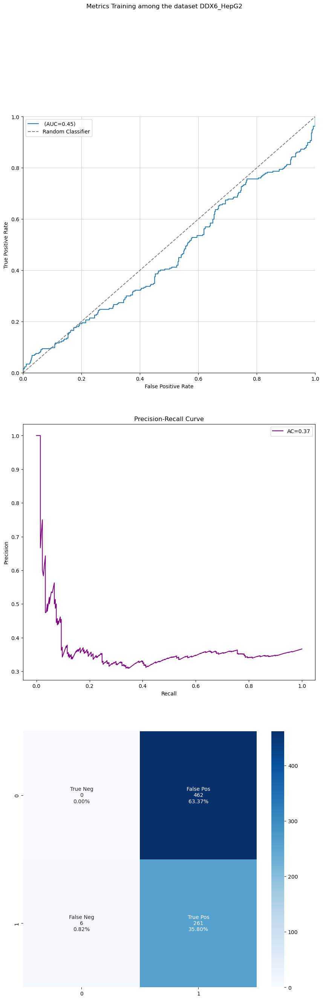

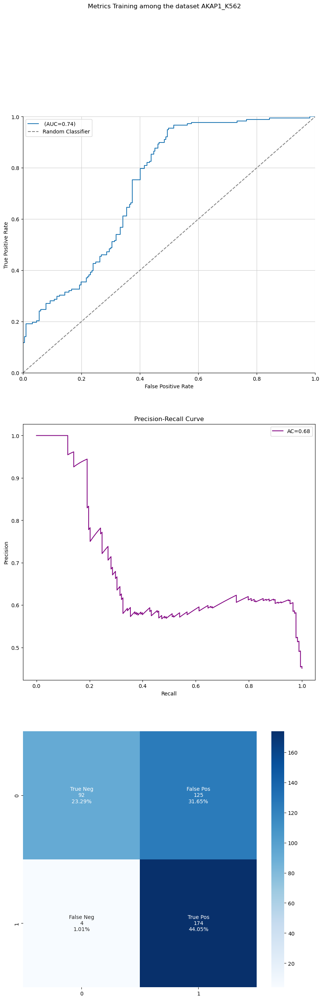

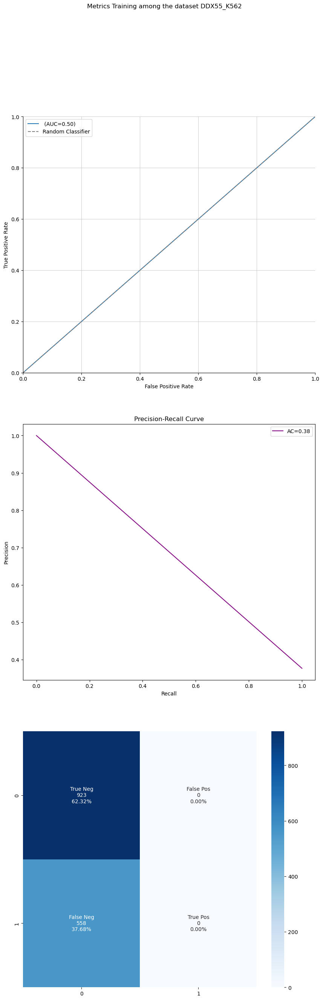

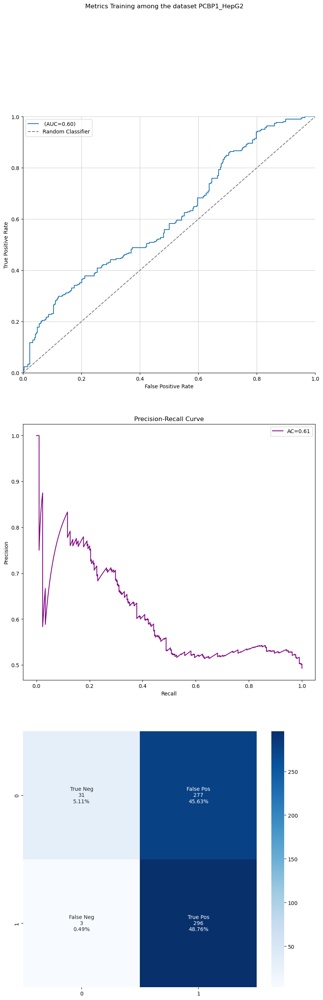

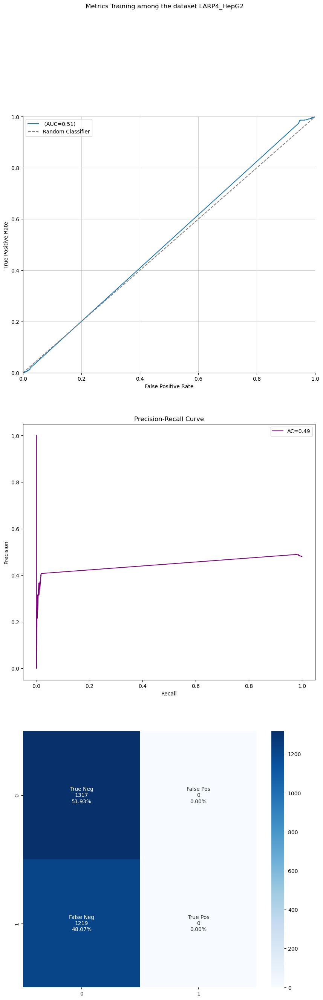

...

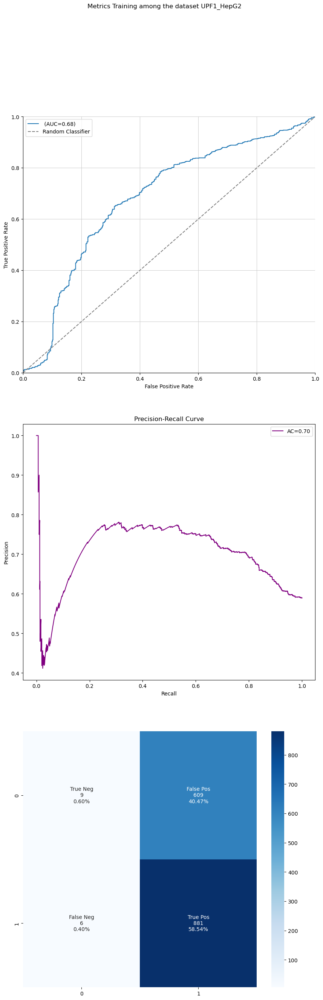

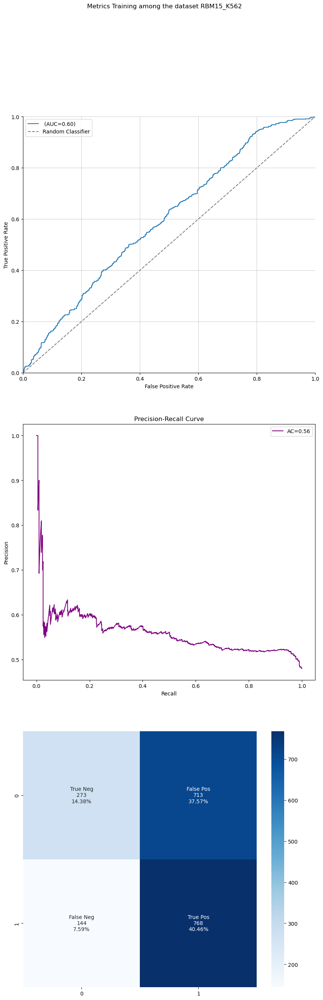

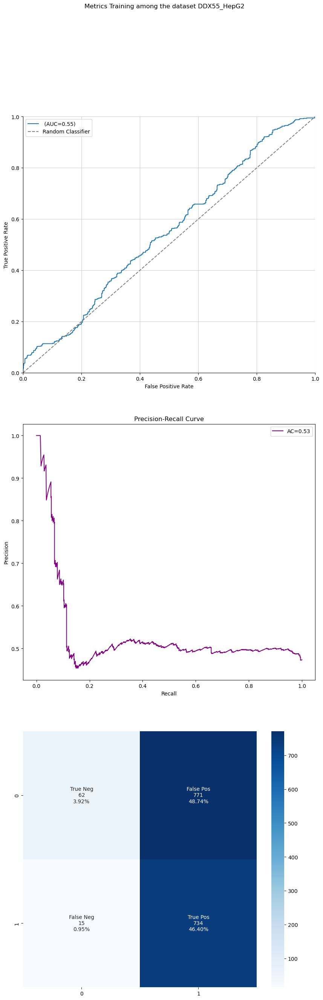

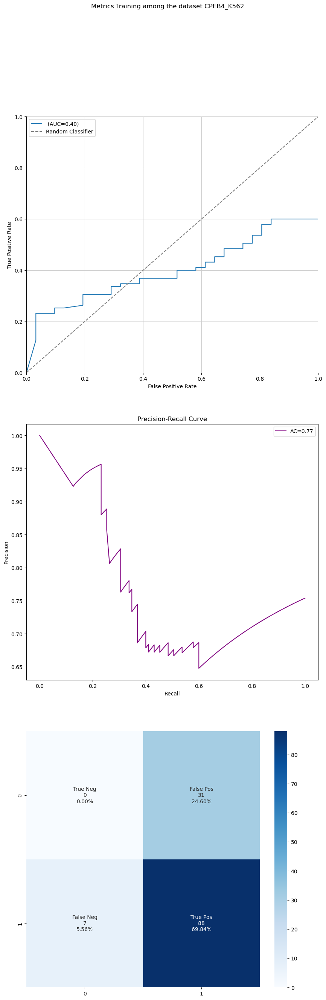

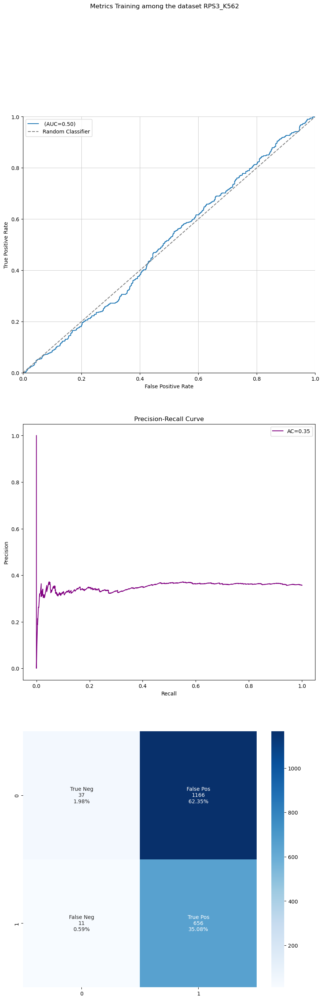

In [30]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_baseline_A_aug_neg2'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)


for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)
data_auc_og = data_auc
data_auc_og['model'] = 'Baseline'

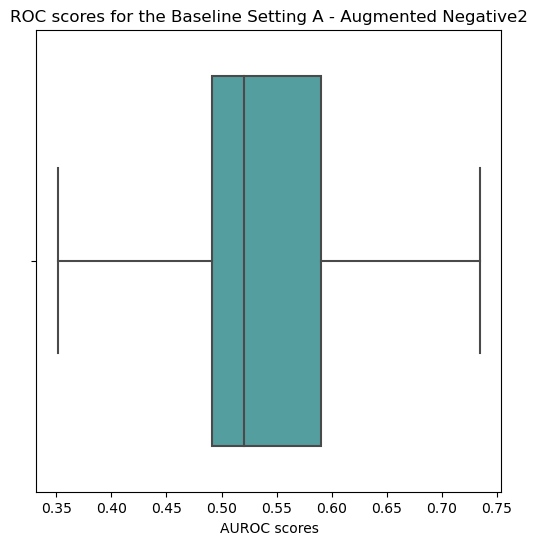

In [141]:
(mdl.boxplot_roc(data_auc,'ROC scores for the Baseline Setting A - Augmented Negative2')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

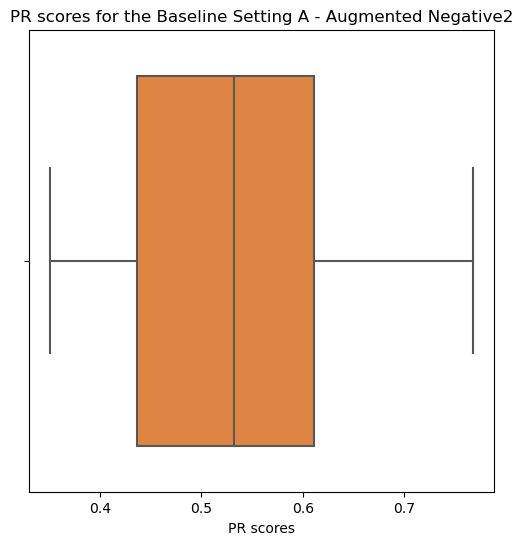

In [142]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Baseline Setting A - Augmented Negative2')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Model Setting A augmented

/home/ubuntu/src/model.py:843: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 30))


\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & AKAP1 & 0.5815 & 0.6346 \\
HepG2 & DDX55 & 0.5084 & 0.5270 \\
HepG2 & DDX6 & 0.5376 & 0.4834 \\
HepG2 & IGF2BP3 & 0.5117 & 0.5780 \\
HepG2 & LARP4 & 0.5157 & 0.5245 \\
HepG2 & PCBP1 & 0.6716 & 0.6878 \\
HepG2 & RBM15 & 0.5231 & 0.5209 \\
HepG2 & SUB1 & 0.4926 & 0.4788 \\
HepG2 & UPF1 & 0.5945 & 0.6999 \\
K562 & AKAP1 & 0.5177 & 0.4609 \\
K562 & APOBEC3C & 0.5868 & 0.5967 \\
K562 & CPEB4 & 0.9032 & 0.9446 \\
K562 & DDX55 & 0.5471 & 0.4243 \\
K562 & DDX6 & 0.5619 & 0.5041 \\
K562 & IGF2BP1 & 0.4112 & 0.5704 \\
K562 & IGF2BP2 & 0.5451 & 0.4641 \\
K562 & LARP4 & 0.6083 & 0.6520 \\
K562 & METAP2 & 0.6441 & 0.6278 \\
K562 & NOLC1 & 0.5375 & 0.5760 \\
K562 & NPM1 & 0.3928 & 0.3196 \\
K562 & PABPC4 & 0.5064 & 0.4911 \\
K562 & PCBP1 & 0.6069 & 0.5364 \\
K562 & PUM1 & 0.6003 & 0.4399 \\
K562 & PUM2 & 0.5447 & 0.5326 \\
K562 & RBM15 & 0.6265 & 0.5809 \\
K562 & RPS3 & 0.5504 & 0.3832 \\
K562 & SDAD1 &

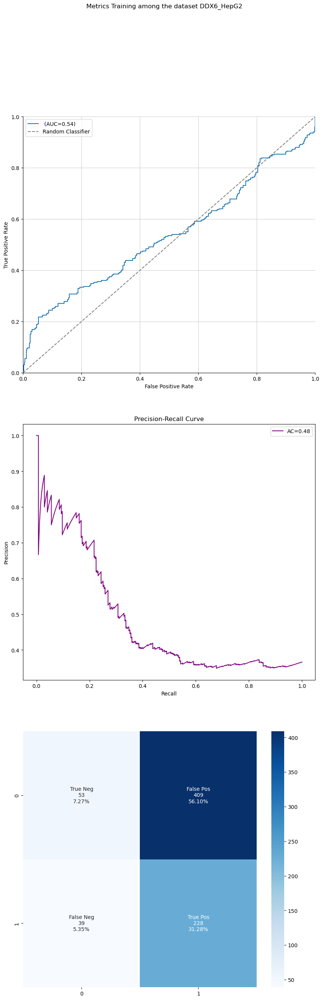

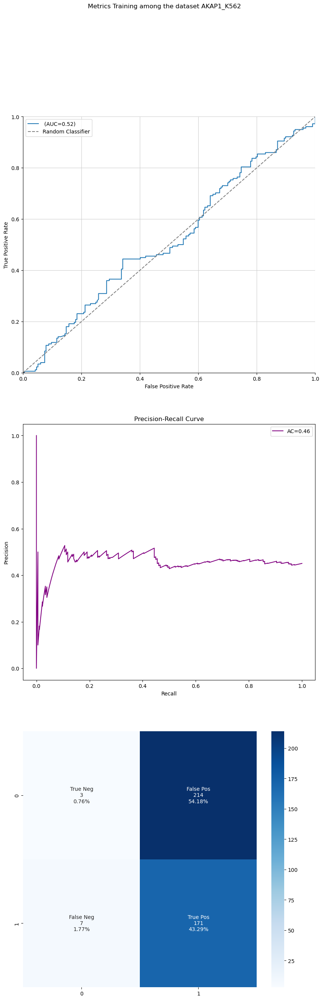

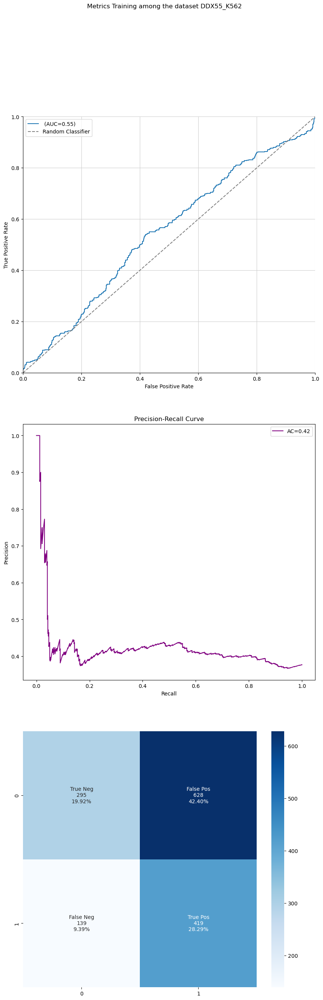

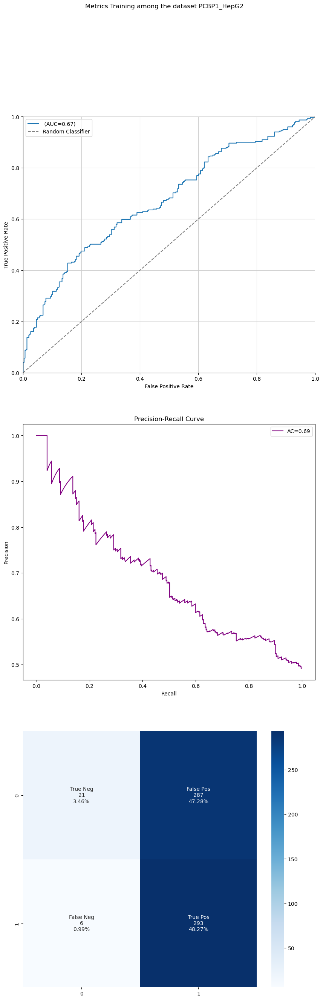

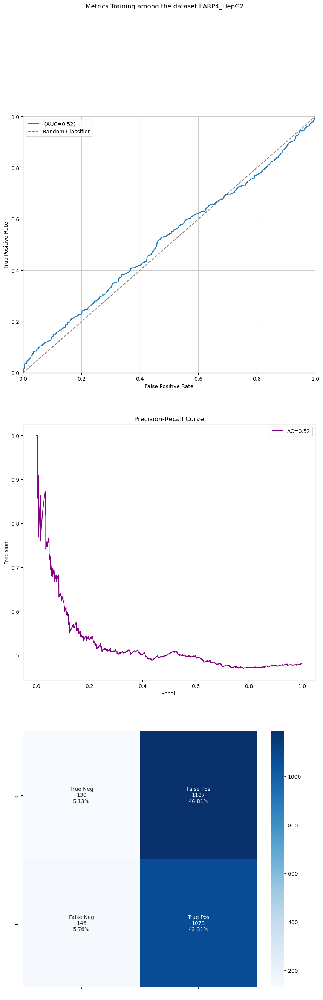

...

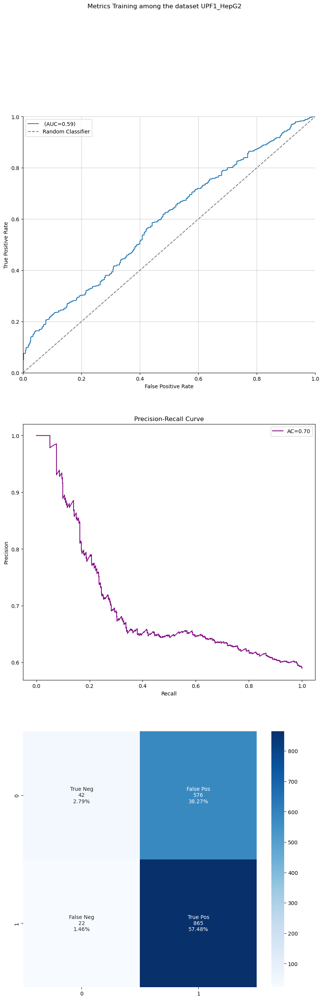

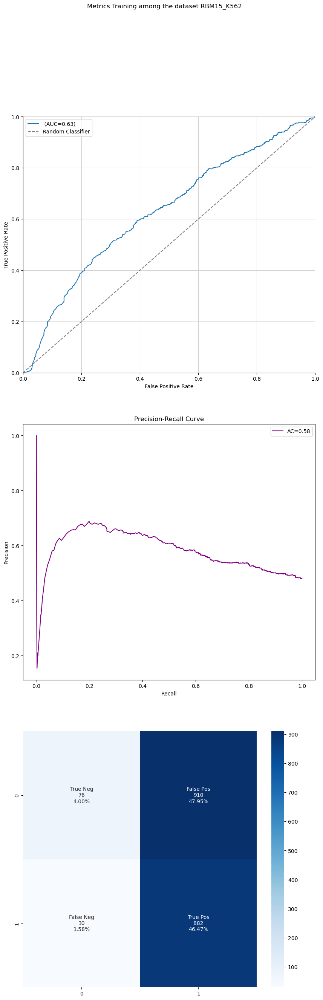

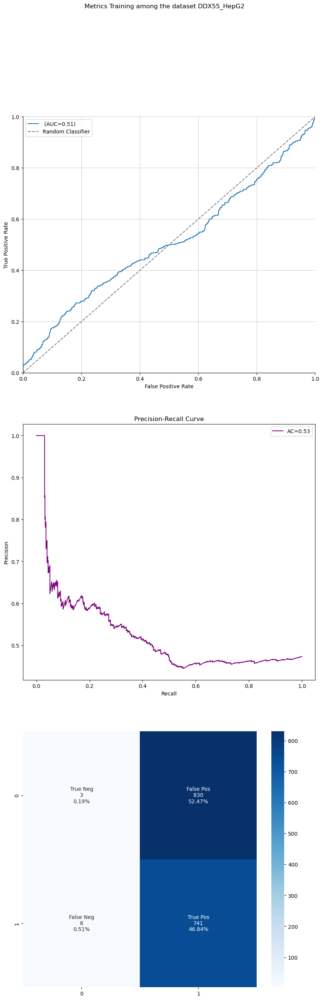

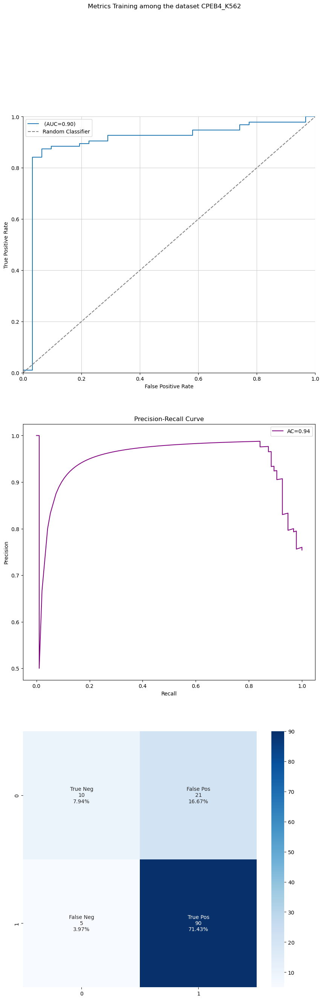

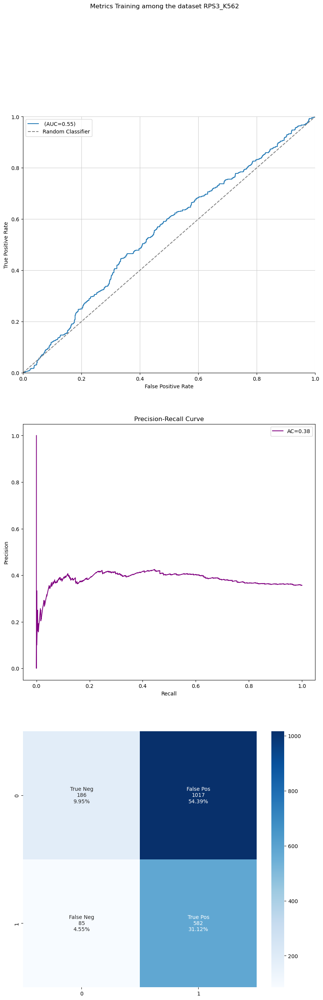

In [31]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_setting_A_aug_neg2'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)


for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)
data_auc_tun = data_auc
data_auc_tun['model'] = 'Integrated'

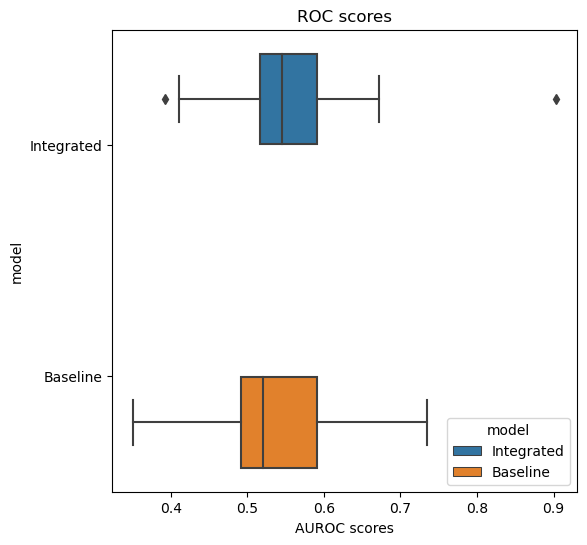

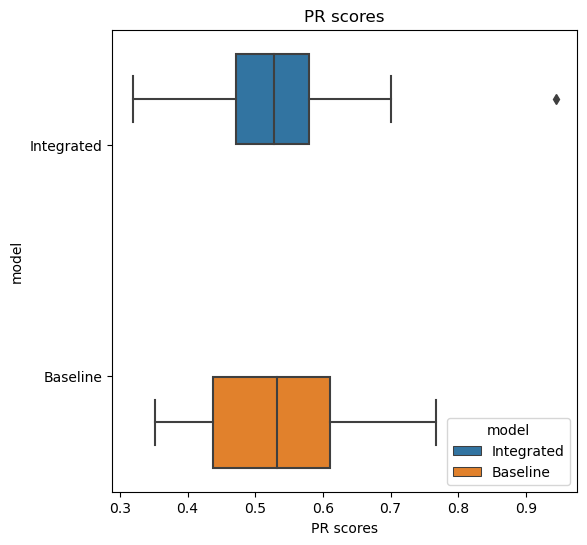

In [32]:
(mdl.boxplot_double_roc(data_auc_tun, data_auc_og, 'ROC scores')).savefig(
    f'{plotspath}ROC_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

(mdl.boxplot_double_pr(data_auc_tun, data_auc_og, 'PR scores')).savefig(
    f'{plotspath}PR_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

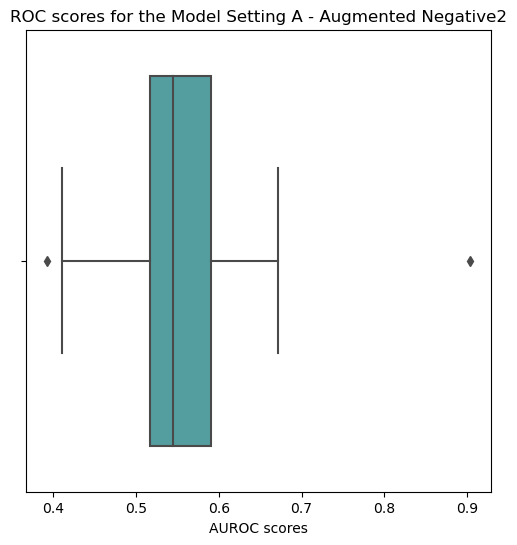

In [144]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Model Setting A - Augmented Negative2')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

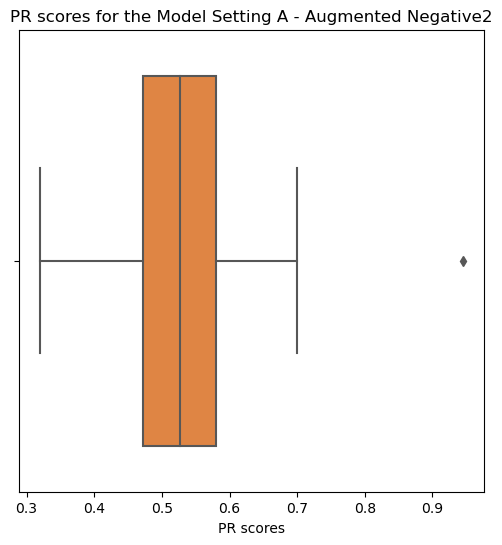

In [145]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Model Setting A - Augmented Negative2')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Baseline Setting B augmented

In [33]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_baseline_B_aug_neg2'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)


for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)
data_auc_og = data_auc
data_auc_og['model'] = 'Baseline'

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & AKAP1 & 0.8001 & 0.7801 \\
HepG2 & DDX55 & 0.6973 & 0.6804 \\
HepG2 & DDX6 & 0.5000 & 0.5000 \\
HepG2 & IGF2BP3 & 0.7619 & 0.7412 \\
HepG2 & LARP4 & 0.5002 & 0.5002 \\
HepG2 & PCBP1 & 0.8066 & 0.7672 \\
HepG2 & RBM15 & 0.7507 & 0.7316 \\
HepG2 & SUB1 & 0.7395 & 0.7289 \\
HepG2 & UPF1 & 0.7909 & 0.7574 \\
K562 & AKAP1 & 0.7639 & 0.7428 \\
K562 & APOBEC3C & 0.6371 & 0.6296 \\
K562 & CPEB4 & 0.7517 & 0.7718 \\
K562 & DDX55 & 0.6741 & 0.6426 \\
K562 & DDX6 & 0.5000 & 0.5000 \\
K562 & IGF2BP1 & 0.8169 & 0.7914 \\
K562 & IGF2BP2 & 0.7697 & 0.7542 \\
K562 & LARP4 & 0.6363 & 0.6417 \\
K562 & METAP2 & 0.7719 & 0.7546 \\
K562 & NOLC1 & 0.7019 & 0.6821 \\
K562 & NPM1 & 0.5607 & 0.5675 \\
K562 & PABPC4 & 0.7613 & 0.7525 \\
K562 & PCBP1 & 0.8295 & 0.8033 \\
K562 & PUM1 & 0.7692 & 0.7422 \\
K562 & PUM2 & 0.8726 & 0.8744 \\
K562 & RBM15 & 0.8335 & 0.8171 \\
K562 & RPS3 & 0.7504 & 0.7120 \\
K562 & SDAD1 &

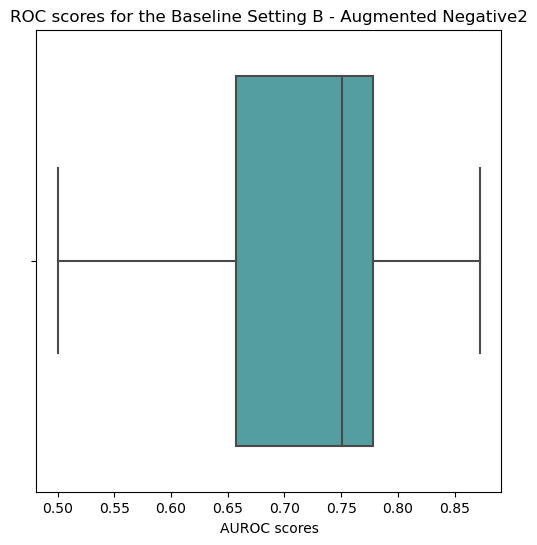

In [6]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Baseline Setting B - Augmented Negative2')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

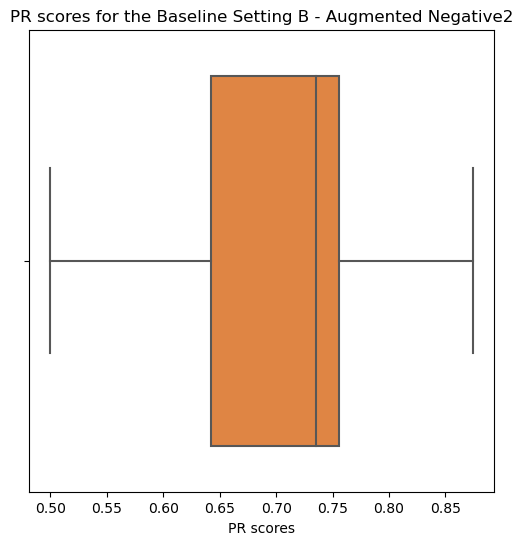

In [7]:
(mdl.boxplot_pr(data_auc, 'PR scores for the Baseline Setting B - Augmented Negative2')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Model Setting B augmented

In [34]:
data_auc = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])
output_folder= '_setting_B_aug_neg2'
path = f'{resultspath}all_predictions/{output_folder}'
directory1 = os.listdir(path)


for file in directory1:
    if 'csv' in file: 
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)
        rbp = str(file).split('.')[0]
        threshold = 0.5
        df['y_pred_thresh'] = np.where(df['Predictions'] > threshold, 1, 0)
        folder = rbp
        path_figure = f'{plotspath}summary_metrics/{folder}/'
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.savefig(f'{path_figure}metrics_training{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)
        
        #fig = mdl.plot_metrics_prediction(df['True'], df['Predictions'], df['y_pred_thresh'], rbp)
        #fig.show()
        # pr_auc
        average_precision = average_precision_score(df['True'], df['Predictions'])
        # roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
        
    datafile_auc= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
    data_auc = pd.concat([data_auc,datafile_auc])
    
mdl.create_table_latex(data_auc)
data_auc_tun = data_auc
data_auc_tun['model'] = 'Integrated'

\begin{tabular}{llrr}
\toprule
Cell line & RBP & roc_auc_score & pr_auc_score \\
\midrule
HepG2 & AKAP1 & 0.8966 & 0.9137 \\
HepG2 & DDX55 & 0.8385 & 0.8752 \\
HepG2 & DDX6 & 0.7981 & 0.8485 \\
HepG2 & IGF2BP3 & 0.9245 & 0.9338 \\
HepG2 & LARP4 & 0.8372 & 0.8780 \\
HepG2 & PCBP1 & 0.9504 & 0.9540 \\
HepG2 & RBM15 & 0.8933 & 0.9137 \\
HepG2 & SUB1 & 0.8957 & 0.9139 \\
HepG2 & UPF1 & 0.9155 & 0.9273 \\
K562 & AKAP1 & 0.9021 & 0.9182 \\
K562 & APOBEC3C & 0.8348 & 0.8718 \\
K562 & CPEB4 & 0.8963 & 0.9176 \\
K562 & DDX55 & 0.8492 & 0.8840 \\
K562 & DDX6 & 0.8243 & 0.8694 \\
K562 & IGF2BP1 & 0.9165 & 0.9277 \\
K562 & IGF2BP2 & 0.9182 & 0.9305 \\
K562 & LARP4 & 0.8377 & 0.8769 \\
K562 & METAP2 & 0.9020 & 0.9206 \\
K562 & NOLC1 & 0.8665 & 0.8954 \\
K562 & NPM1 & 0.6267 & 0.6719 \\
K562 & PABPC4 & 0.8945 & 0.9166 \\
K562 & PCBP1 & 0.9646 & 0.9671 \\
K562 & PUM1 & 0.8913 & 0.9122 \\
K562 & PUM2 & 0.9782 & 0.9816 \\
K562 & RBM15 & 0.9462 & 0.9529 \\
K562 & RPS3 & 0.8801 & 0.9001 \\
K562 & SDAD1 &

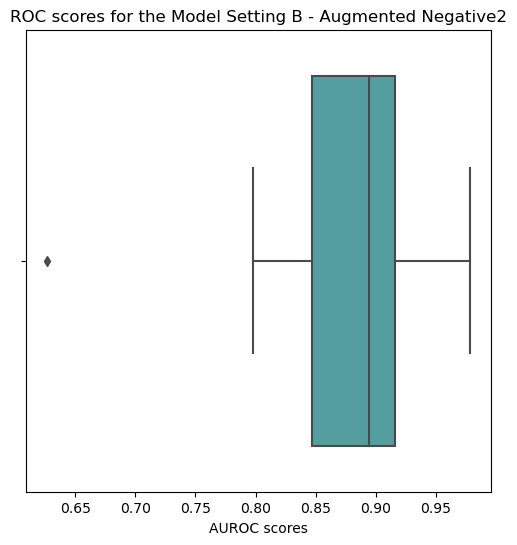

In [9]:
(mdl.boxplot_roc(data_auc, 'ROC scores for the Model Setting B - Augmented Negative2')).savefig(
    f'{plotspath}ROC_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

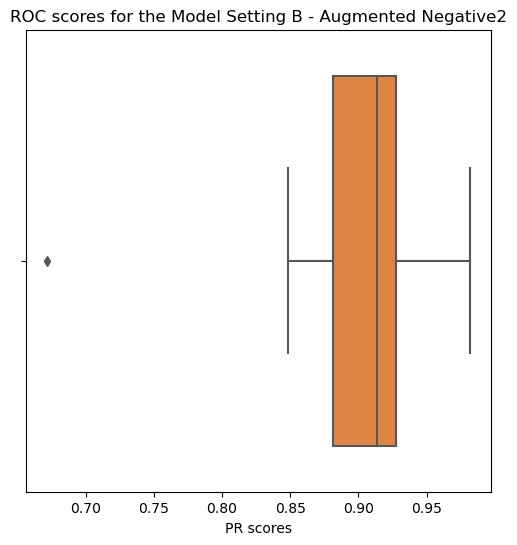

In [10]:
(mdl.boxplot_pr(data_auc, 'ROC scores for the Model Setting B - Augmented Negative2')).savefig(
    f'{plotspath}PR_agg{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

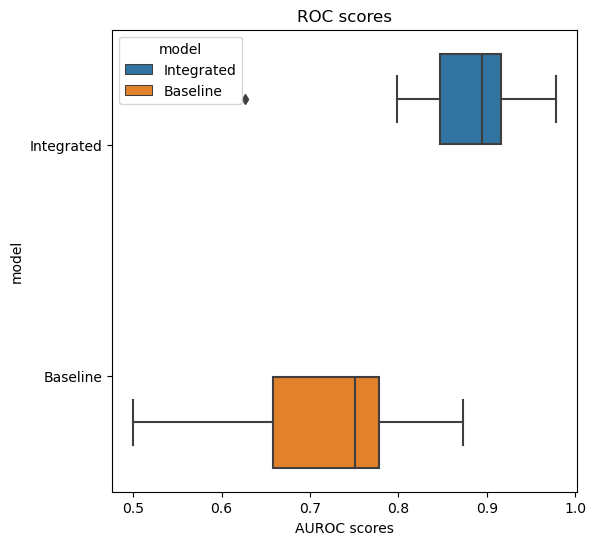

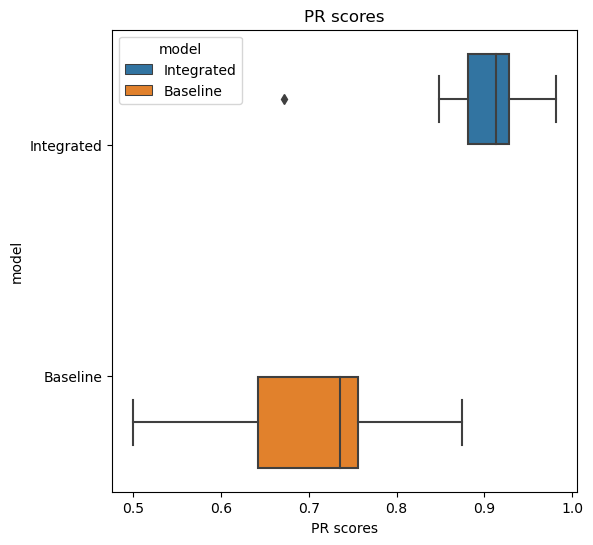

In [35]:
(mdl.boxplot_double_roc(data_auc_tun, data_auc_og, 'ROC scores')).savefig(
    f'{plotspath}ROC_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

(mdl.boxplot_double_pr(data_auc_tun, data_auc_og, 'PR scores')).savefig(
    f'{plotspath}PR_agg_double{output_folder}.pdf', format='pdf', bbox_inches='tight', pad_inches = 0)

# Model Setting A - neg2

In [22]:
data_auroc_A_2 = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])

In [24]:
data_auroc_A_new = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])

,rbp,roc_auc_score,pr_auc_score
0,PCBP1_HepG2,0.723368,0.960726
0,LARP4_HepG2,0.533614,0.921771
0,SUB1_HepG2,0.462484,0.903562
0,PCBP1_K562,0.578390,0.870758
0,AKAP1_K562,0.616279,0.901176
0,RBM15_HepG2,0.600773,0.936898
0,SDAD1_K562,0.630097,0.859394
0,UPF1_K562,0.570572,0.922620


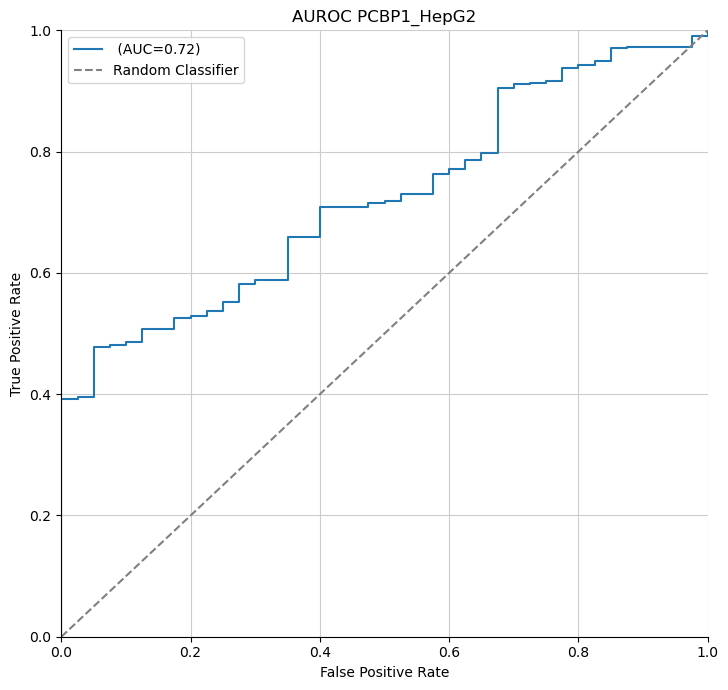

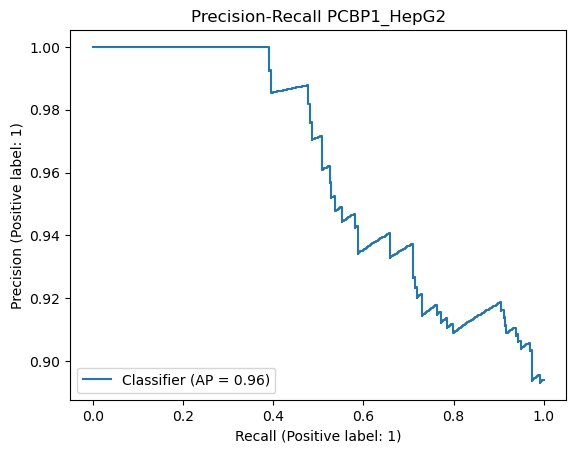

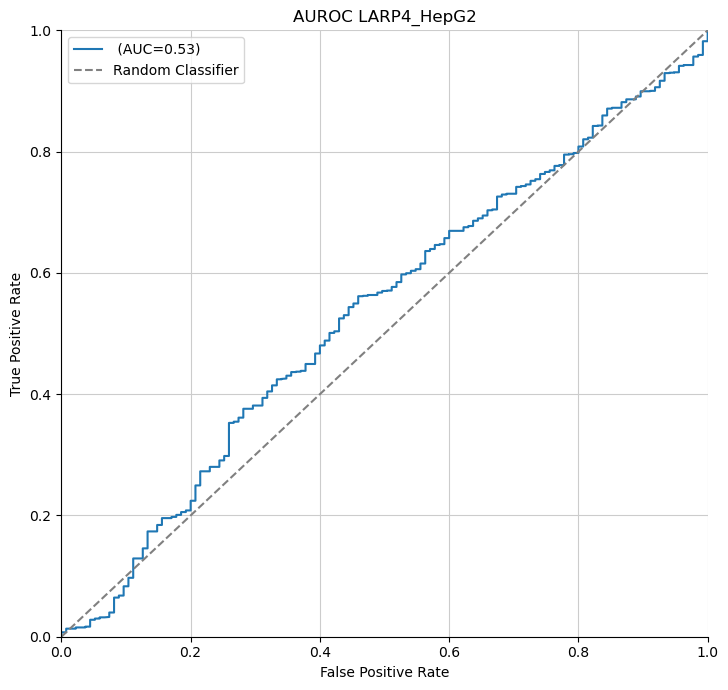

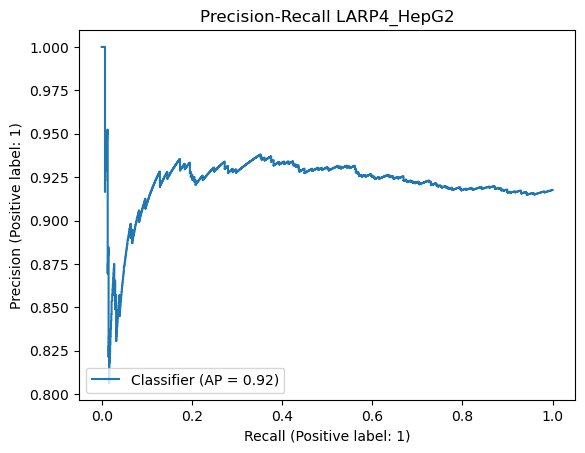

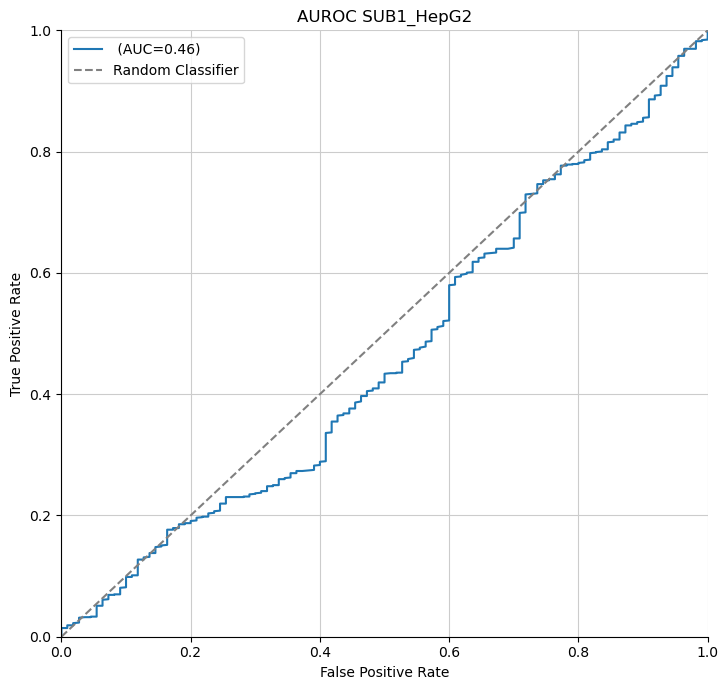

...

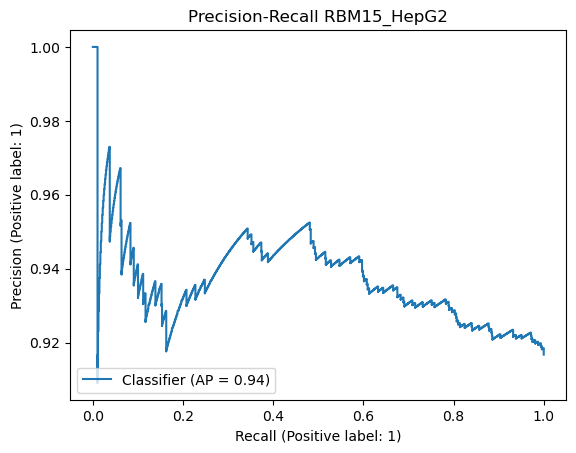

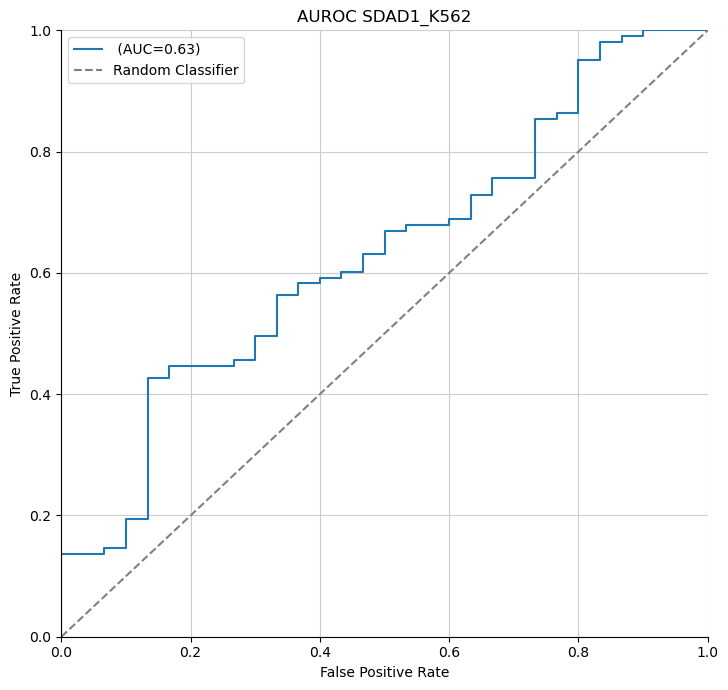

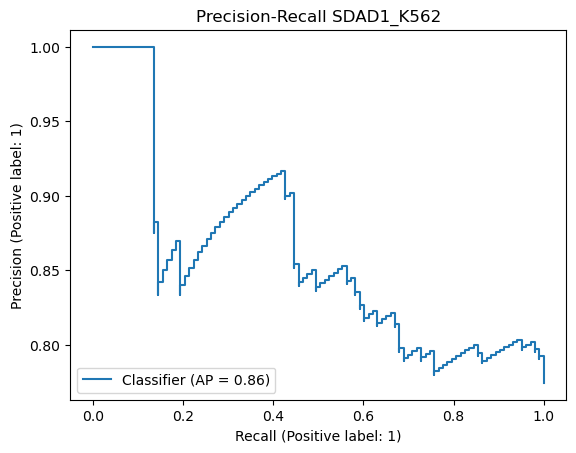

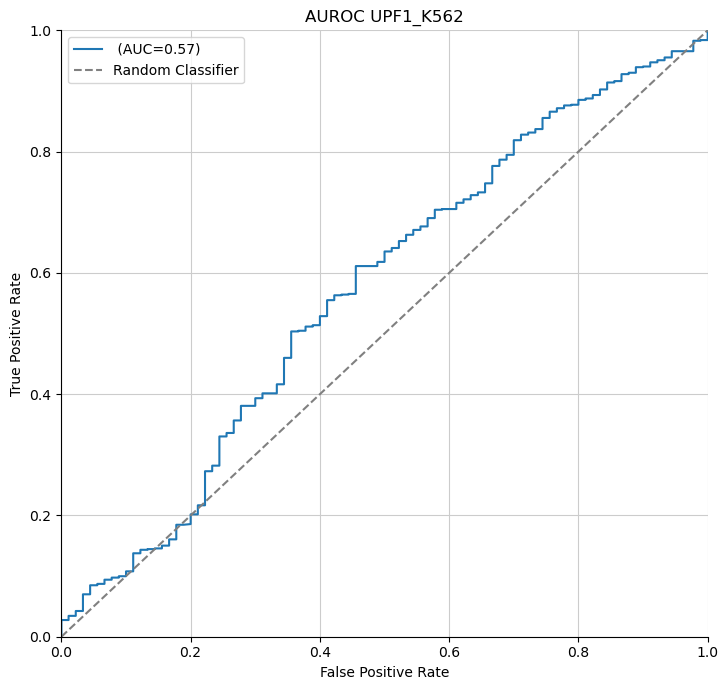

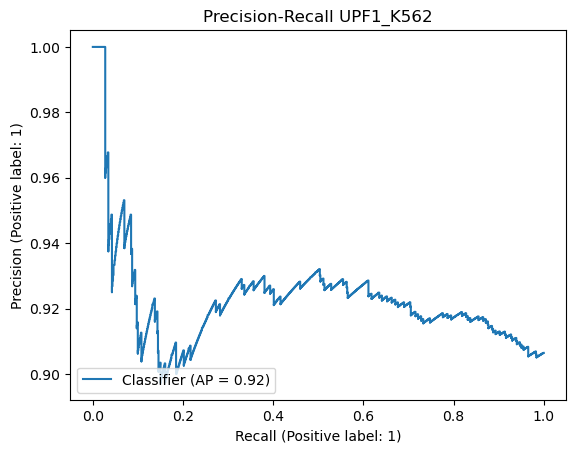

In [25]:
#auroc and auprc plots of all models separately and then boxplot of all roc_values
from matplotlib import pyplot as pt

path = f'{predictionspath}_baseline_A_aug/'
directory1 = os.listdir(path)



#tic()

for file in directory1:
    
    if 'csv' in file: 
        #print(file)
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + '/' + file)

        #roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)

        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])


        # Generate figure
        fig = pl.figure(figsize=(14,7))
        ax = fig.add_subplot(121)

        pl.plot(fpr, tpr, label=" (AUC=%.2f)" % roc_auc)
        ax.plot([0,1], [0,1], color="grey",label="Random Classifier",linestyle="--")
        ax.set_xlabel("False Positive Rate")
        ax.set_ylabel("True Positive Rate")
        ax.set_ylim(0,1)
        ax.set_xlim(0,1)
        ax.grid(color="#CCCCCC")
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        rbp = str(file).split('.')[0]
        pt.title('AUROC %s' % rbp)
        pl.legend()
        pl.tight_layout()



    # pr_auc
    from sklearn.metrics import average_precision_score, precision_recall_curve
    from sklearn.metrics import PrecisionRecallDisplay
    average_precision = average_precision_score(df['True'], df['Predictions'])
    
    display = PrecisionRecallDisplay.from_predictions(df['True'], df['Predictions'])
    _ = display.ax_.set_title("Precision-Recall %s" % rbp)
    
    datafile_A_new= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
   
    
    data_auroc_A_new = pd.concat([data_auroc_A_new,datafile_A_new])


data_auroc_A_new

[Text(0.5, 1.0, 'Receiver Operating Characteristic scores for the model baseline setting A - augmented')]

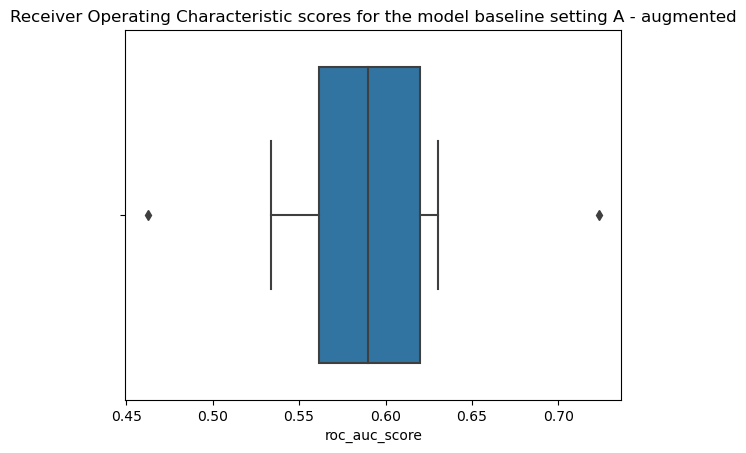

In [26]:
import seaborn as sns
sns.boxplot(x=data_auroc_A_new["roc_auc_score"]).set(title='Receiver Operating Characteristic scores for the model baseline setting A - augmented')

[Text(0.5, 1.0, 'Precision Recall scores for the model baseline setting A - augmented')]

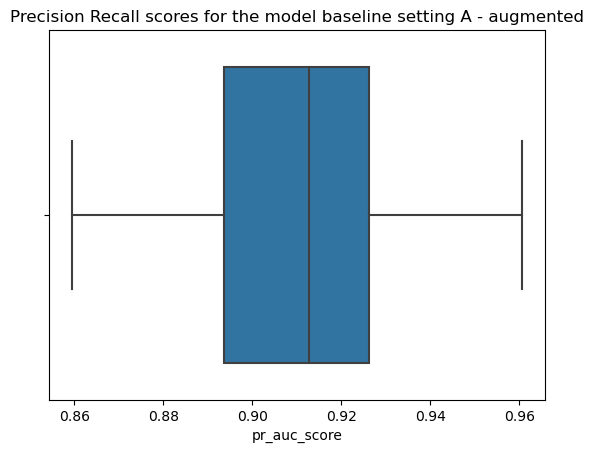

In [27]:
sns.boxplot(x=data_auroc_A_new["pr_auc_score"]).set(title='Precision Recall scores for the model baseline setting A - augmented')

# Model Setting A augmented 

In [28]:
data_auroc_A_new = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])

,rbp,roc_auc_score,pr_auc_score
0,PCBP1_HepG2,0.776558,0.965522
0,LARP4_HepG2,0.559752,0.926606
0,SUB1_HepG2,0.601385,0.922421
0,PCBP1_K562,0.615390,0.902978
0,AKAP1_K562,0.644961,0.887094
0,RBM15_HepG2,0.699446,0.955671
0,SDAD1_K562,0.440453,0.737623
0,PCBP1_HepG2,0.776558,0.965522
0,LARP4_HepG2,0.559752,0.926606
0,SUB1_HepG2,0.601385,0.922421


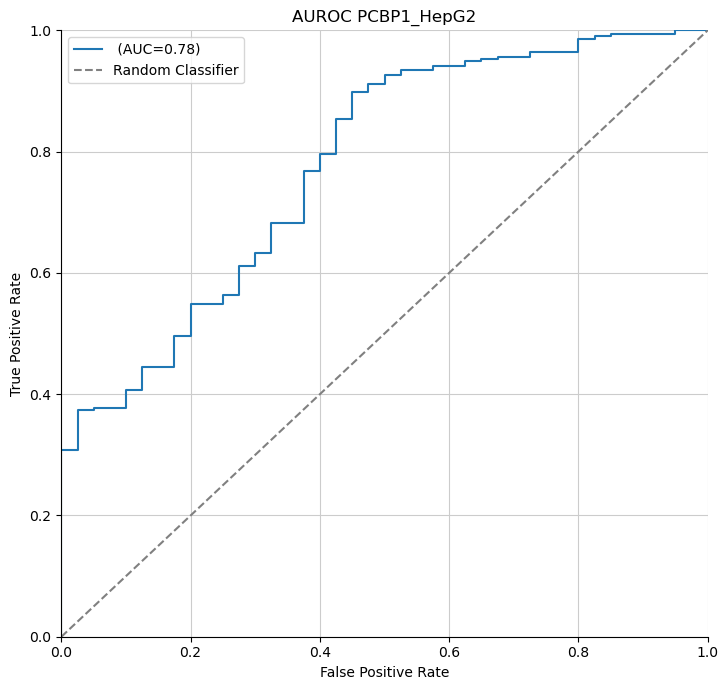

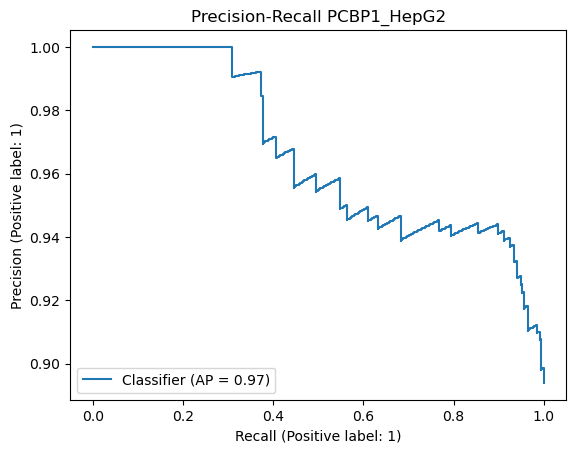

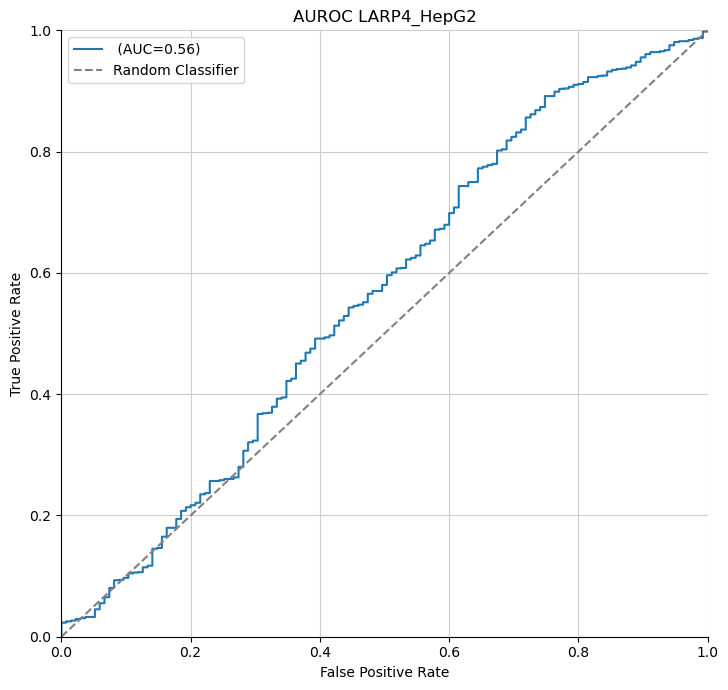

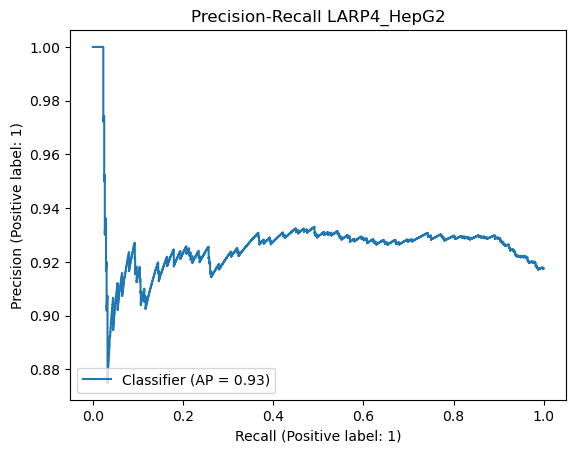

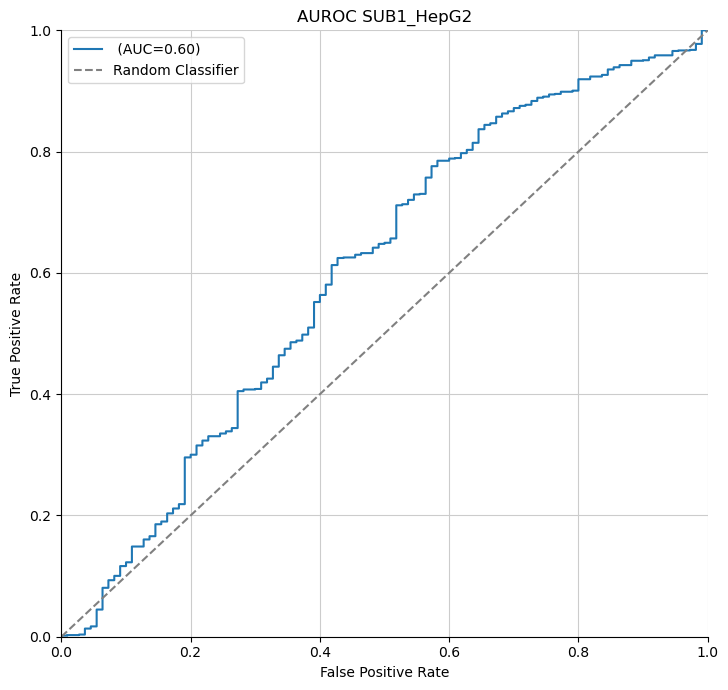

...

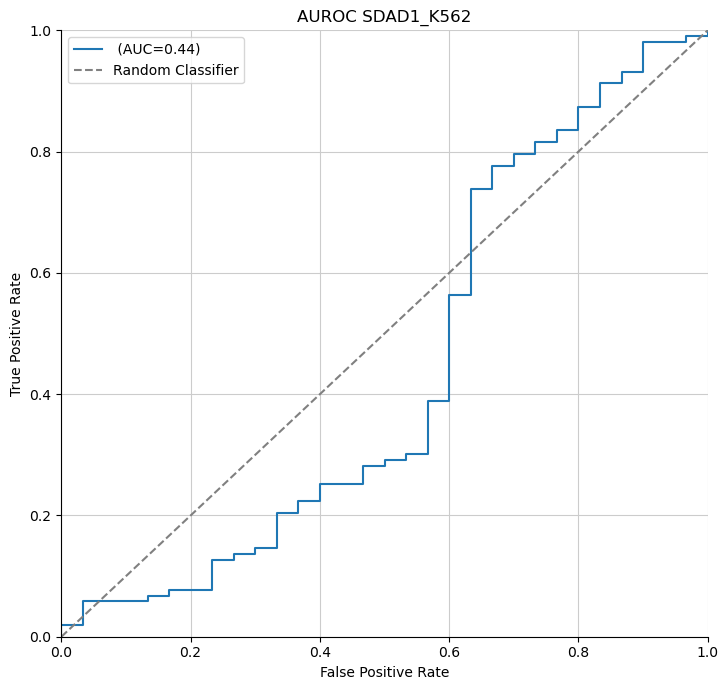

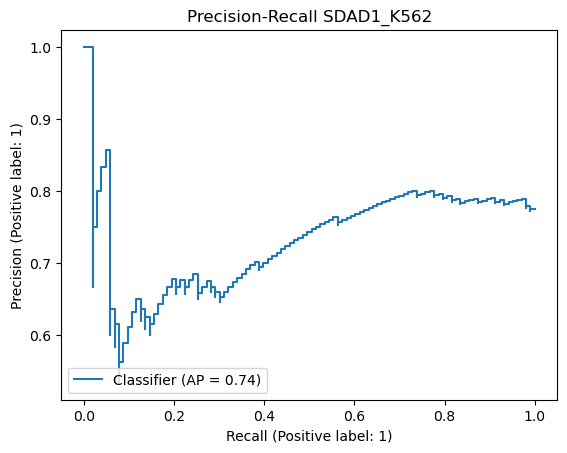

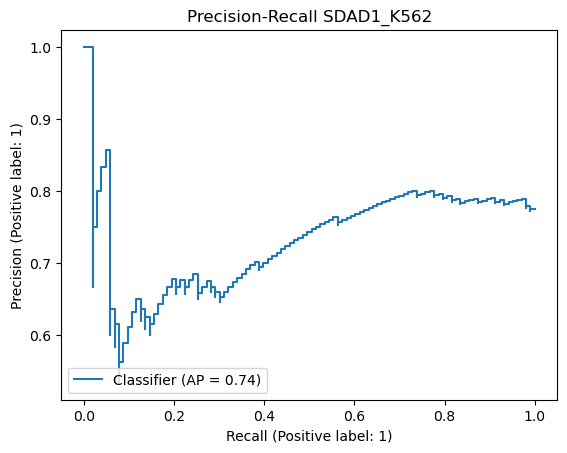

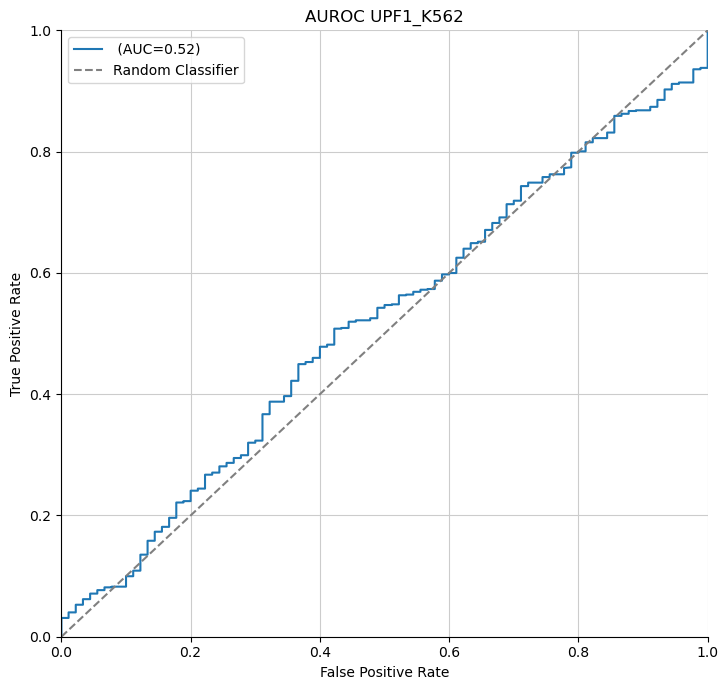

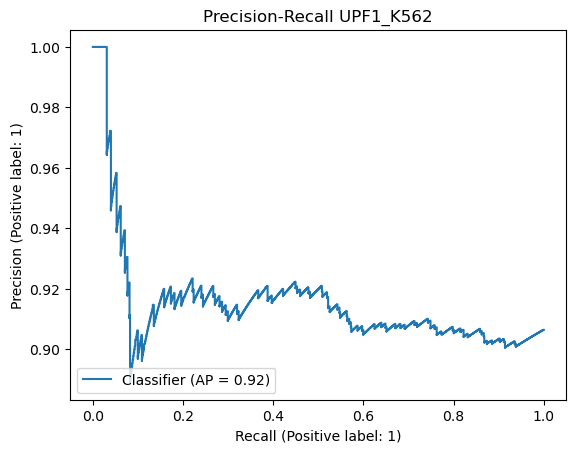

In [31]:
#auroc and auprc plots of all models separately and then boxplot of all roc_values
from matplotlib import pyplot as pt

path = f'{predictionspath}_setting_A_aug/'
directory1 = os.listdir(path)



#tic()

for file in directory1:
    
    if 'csv' in file :
        #print(file)
        # Compute metrics for ROC Curve
        df = pd.read_csv(path + file)

        #roc_auc
        fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)

        roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])


        # Generate figure
        fig = pl.figure(figsize=(14,7))
        ax = fig.add_subplot(121)

        pl.plot(fpr, tpr, label=" (AUC=%.2f)" % roc_auc)
        ax.plot([0,1], [0,1], color="grey",label="Random Classifier",linestyle="--")
        ax.set_xlabel("False Positive Rate")
        ax.set_ylabel("True Positive Rate")
        ax.set_ylim(0,1)
        ax.set_xlim(0,1)
        ax.grid(color="#CCCCCC")
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        rbp = str(file).split('.')[0]
        pt.title('AUROC %s' % rbp)
        pl.legend()
        pl.tight_layout()



    # pr_auc
    from sklearn.metrics import average_precision_score, precision_recall_curve
    from sklearn.metrics import PrecisionRecallDisplay
    average_precision = average_precision_score(df['True'], df['Predictions'])
    
    display = PrecisionRecallDisplay.from_predictions(df['True'], df['Predictions'])
    _ = display.ax_.set_title("Precision-Recall %s" % rbp)
    
    datafile_A_new= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
   
    
    data_auroc_A_new = pd.concat([data_auroc_A_new,datafile_A_new])


data_auroc_A_new

[Text(0.5, 1.0, 'Receiver Operating Characteristic scores for the model setting A - augmented')]

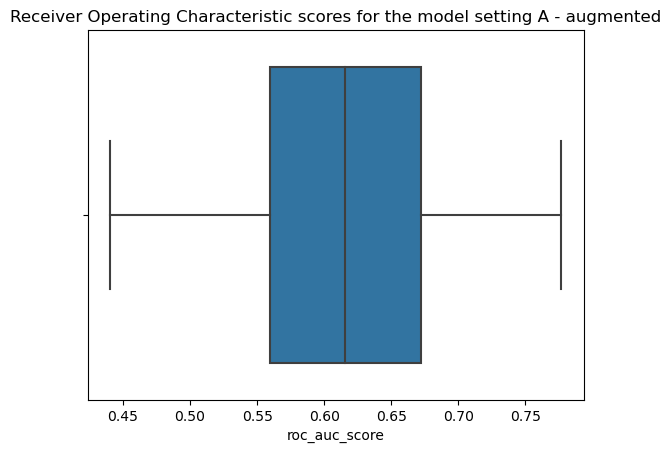

In [32]:
import seaborn as sns
sns.boxplot(x=data_auroc_A_new["roc_auc_score"]).set(title='Receiver Operating Characteristic scores for the model setting A - augmented')

[Text(0.5, 1.0, 'Precision Recall scores for the model setting A -augmented')]

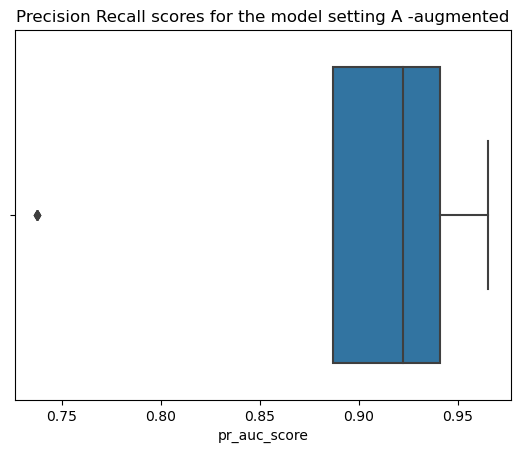

In [33]:
sns.boxplot(x=data_auroc_A_new["pr_auc_score"]).set(title='Precision Recall scores for the model setting A -augmented')

# Model Setting A - new neg1 dataset 

In [16]:
data_auroc_A_new = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])

#auroc and auprc plots of all models separately and then boxplot of all roc_values
from matplotlib import pyplot as pt

path = f'{predictionspath}predictions_A_new/'
directory1 = os.listdir(path)



#tic()

for file in directory1:
    
    
    #print(file)
    # Compute metrics for ROC Curve
    df = pd.read_csv(path + '/' + file)
    
    #roc_auc
    fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
    
    roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
    

    # Generate figure
    fig = pl.figure(figsize=(14,7))
    ax = fig.add_subplot(121)

    pl.plot(fpr, tpr, label=" (AUC=%.2f)" % roc_auc)
    ax.plot([0,1], [0,1], color="grey",label="Random Classifier",linestyle="--")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_ylim(0,1)
    ax.set_xlim(0,1)
    ax.grid(color="#CCCCCC")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    rbp = str(file).split('.')[0]
    pt.title('AUROC %s' % rbp)
    pl.legend()
    pl.tight_layout()
    
    
    # pr_auc
    from sklearn.metrics import average_precision_score, precision_recall_curve
    from sklearn.metrics import PrecisionRecallDisplay
    average_precision = average_precision_score(df['True'], df['Predictions'])
    
    display = PrecisionRecallDisplay.from_predictions(df['True'], df['Predictions'])
    _ = display.ax_.set_title("Precision-Recall %s" % rbp)
    
    datafile_A_new= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
   
    
    data_auroc_A_new = pd.concat([data_auroc_A_new,datafile_A_new])


data_auroc_A_new

import seaborn as sns
sns.boxplot(x=data_auroc_A_new["roc_auc_score"]).set(title='Receiver Operating Characteristic scores for the model setting A - new')

sns.boxplot(x=data_auroc_A_new["pr_auc_score"]).set(title='Precision Recall scores for the model setting A -new')

# Model Setting A - new downsampled dataset 

In [17]:
data_auroc_A_new_down = pd.DataFrame(columns = ['rbp', 'roc_auc_score', 'pr_auc_score'])

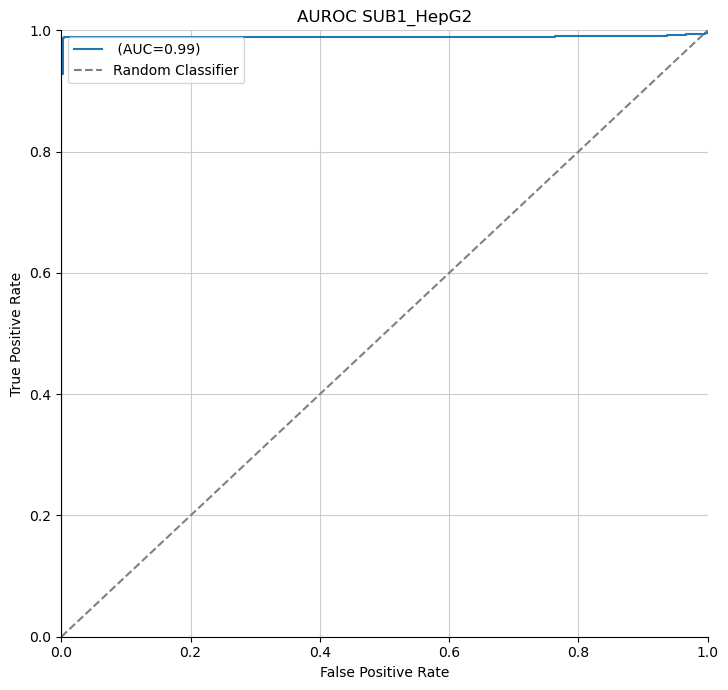

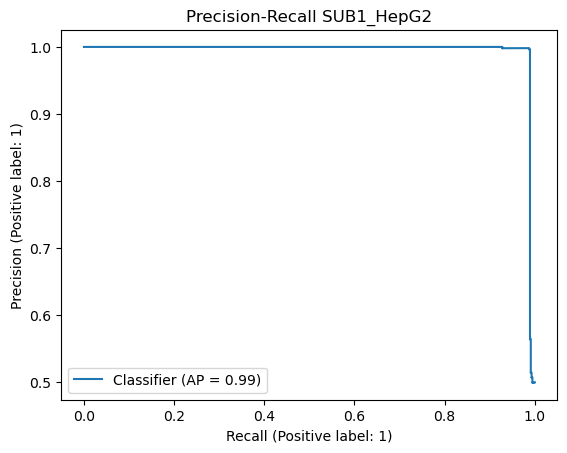

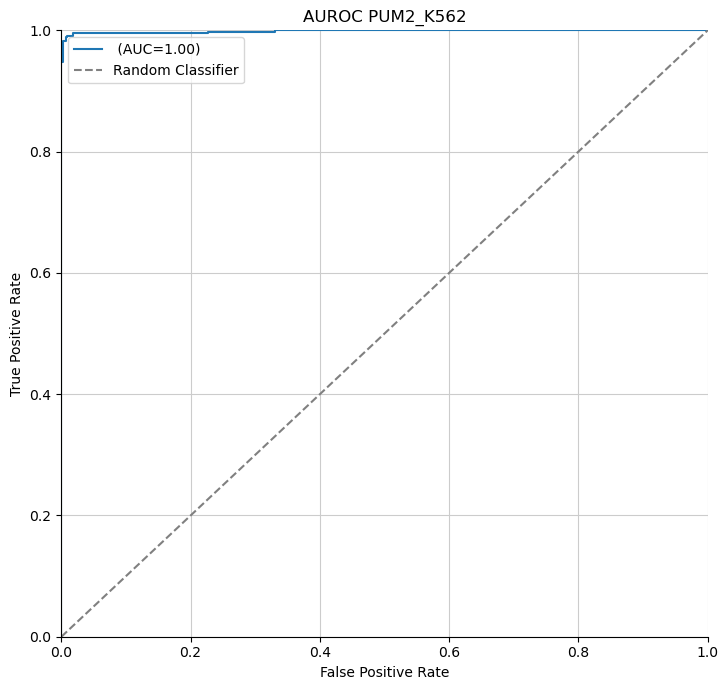

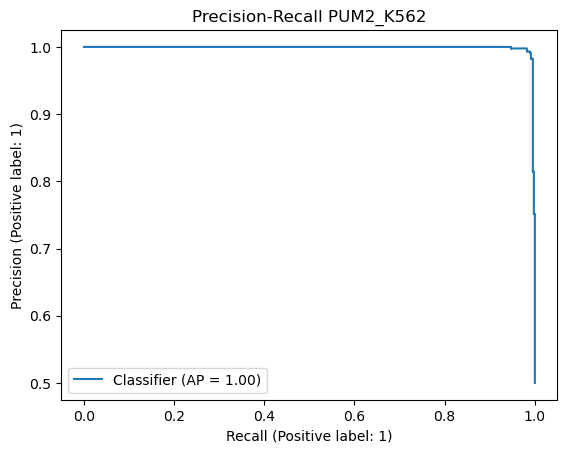

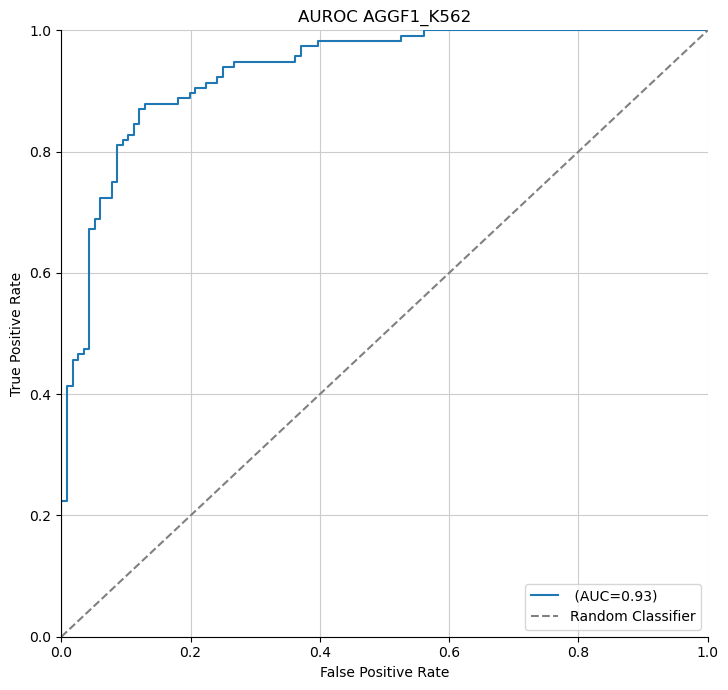

...

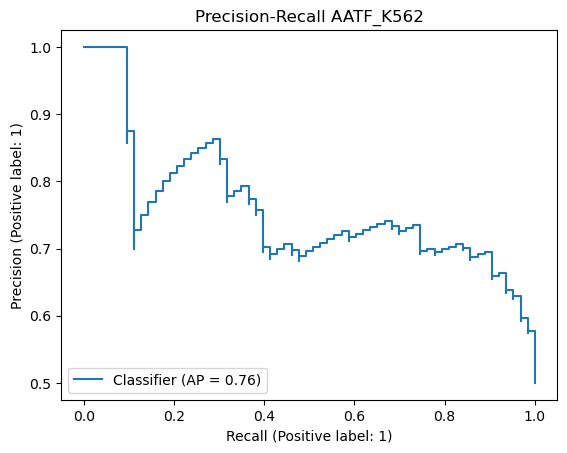

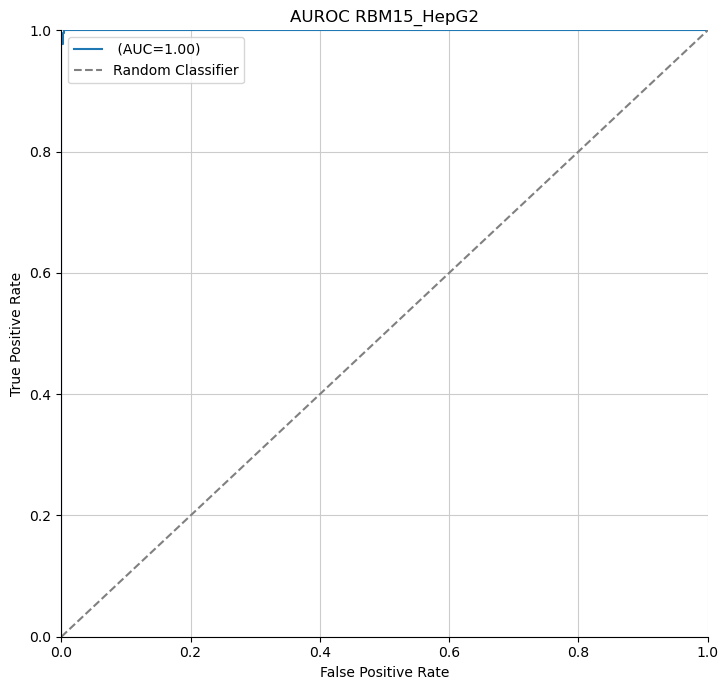

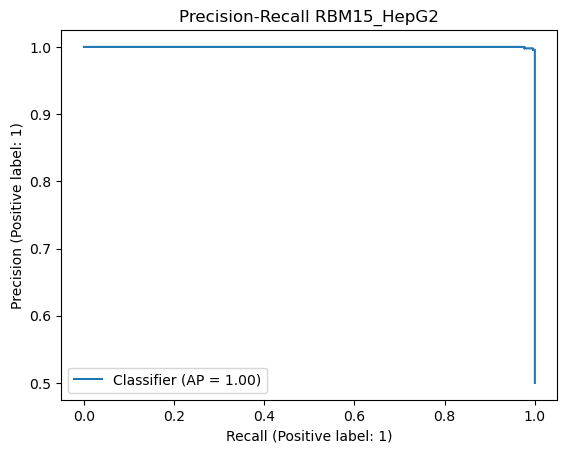

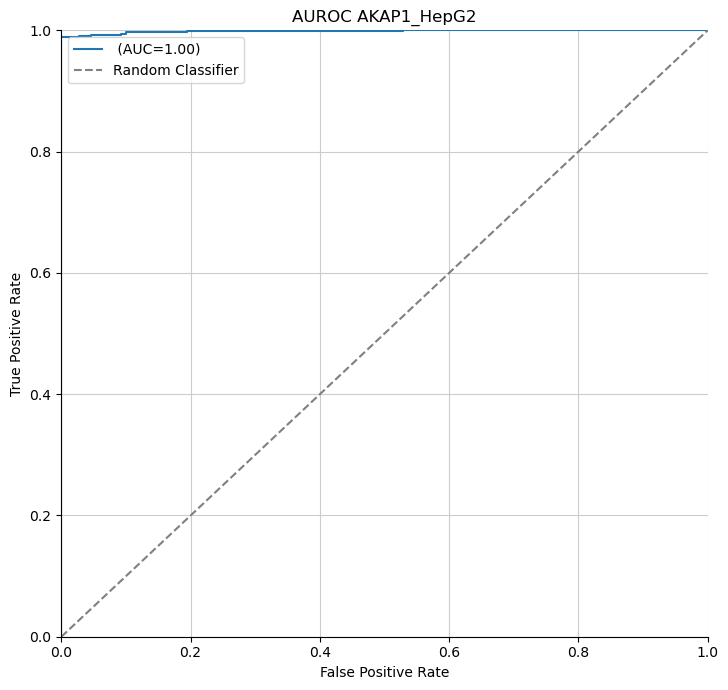

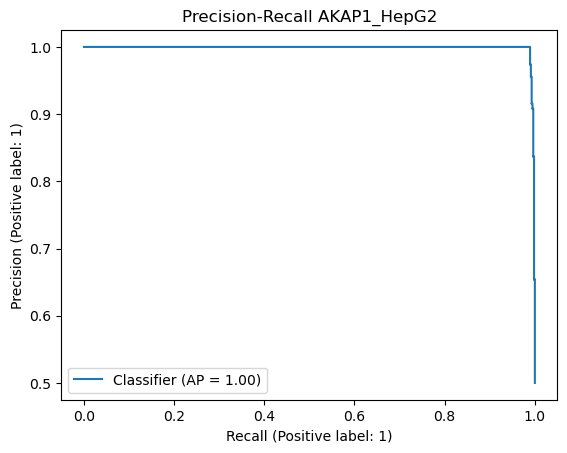

In [18]:
#auroc and auprc plots of all models separately and then boxplot of all roc_values
from matplotlib import pyplot as pt

path = f'{predictionspath}predictions_A_new_down/'
directory1 = os.listdir(path)



#tic()

for file in directory1:
    
    
    #print(file)
    # Compute metrics for ROC Curve
    df = pd.read_csv(path + '/' + file)
    
    #roc_auc
    fpr, tpr, thresholds = metrics.roc_curve(df['True'], df['Predictions'], drop_intermediate=False)
    
    roc_auc = metrics.roc_auc_score(df['True'], df['Predictions'])
    

    # Generate figure
    fig = pl.figure(figsize=(14,7))
    ax = fig.add_subplot(121)

    pl.plot(fpr, tpr, label=" (AUC=%.2f)" % roc_auc)
    ax.plot([0,1], [0,1], color="grey",label="Random Classifier",linestyle="--")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_ylim(0,1)
    ax.set_xlim(0,1)
    ax.grid(color="#CCCCCC")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    rbp = str(file).split('.')[0]
    pt.title('AUROC %s' % rbp)
    pl.legend()
    pl.tight_layout()
    
    
    # pr_auc
    from sklearn.metrics import average_precision_score, precision_recall_curve
    from sklearn.metrics import PrecisionRecallDisplay
    average_precision = average_precision_score(df['True'], df['Predictions'])
    
    display = PrecisionRecallDisplay.from_predictions(df['True'], df['Predictions'])
    _ = display.ax_.set_title("Precision-Recall %s" % rbp)
    
    datafile_A_new_down= pd.DataFrame([[rbp, roc_auc, average_precision]], columns = ['rbp', 'roc_auc_score', 'pr_auc_score'] )
   
    
    data_auroc_A_new_down = pd.concat([data_auroc_A_new_down,datafile_A_new_down])


In [19]:
data_auroc_A_new_down

,rbp,roc_auc_score,pr_auc_score
0,SUB1_HepG2,0.989683,0.994632
0,PUM2_K562,0.998554,0.998825
0,AGGF1_K562,0.932521,0.928549
0,AGGF1_HepG2,0.986133,0.988429
0,AARS_K562,0.799184,0.790042
0,RBM15_K562,0.997655,0.997970
0,PABPC4_K562,0.999059,0.999255
0,AATF_K562,0.789620,0.758780
0,RBM15_HepG2,0.999943,0.999943
0,AKAP1_HepG2,0.998255,0.998666


[Text(0.5, 1.0, 'Receiver Operating Characteristic scores for the model setting A - new_down')]

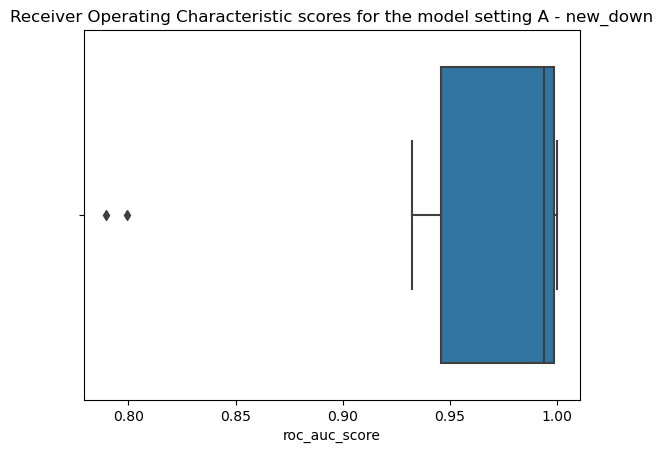

In [20]:
import seaborn as sns
sns.boxplot(x=data_auroc_A_new_down["roc_auc_score"]).set(title='Receiver Operating Characteristic scores for the model setting A - new_down')

[Text(0.5, 1.0, 'Precision Recall scores for the model setting A -new_down')]

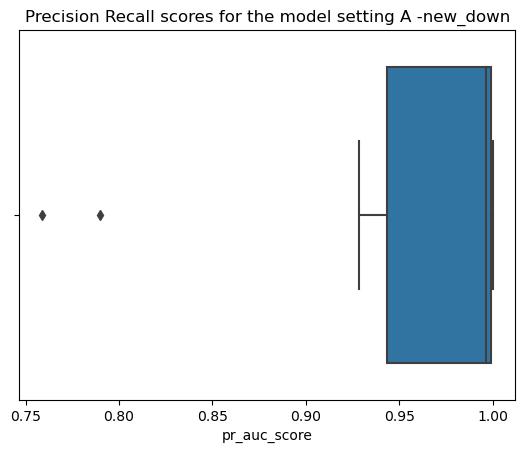

In [21]:
sns.boxplot(x=data_auroc_A_new_down["pr_auc_score"]).set(title='Precision Recall scores for the model setting A -new_down')